<a href="https://colab.research.google.com/github/vlopesliliane/TCCPUCMG/blob/main/TCC_PUC_Final_IPHAN_MUNIC_IBGE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

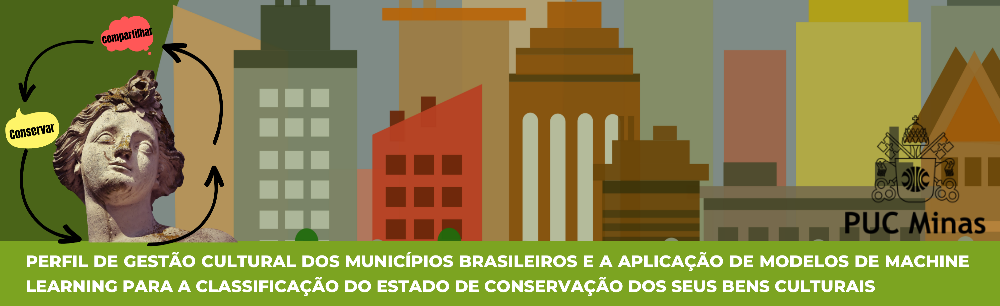

# **1. Definição do problema**

**1- Descrição do problema ou tarefa:**  
De acordo com a Pesquisa de Informações Básicas Municipais – Munic, realizada pelo IBGE, quais características do perfil de gestão municipal da cultura do ano de 2021, mais contribuem para a classificação do estado de conservação dos bens culturais, registrado no Sistema Integrado de Conhecimento e Gestão – SICG/IPHAN?.  
**2- Descrição da solução de IA:**  
Treinamento supervisionado de modelo de classificação do estado de conservação (4 classes) dos bens culturais, registrados no Sistema Integrado de Conhecimento e Gestão – SICG/IPHAN, com os dados de 92 perguntas do questionário da Pesquisa de Informações Básicas Municipais – Munic, ano de 2021, realizada pelo IBGE.  
**3- Fonte de dados:**  
  

*   Pesquisa de Informações Básicas Municipais – Munic: https://www.ibge.gov.br/estatisticas/sociais/saude/10586-pesquisa-de-informacoes-basicas-municipais.html?=&t=downloads 
*   Sistema Integrado de Conhecimento e Gestão – SICG/IPHAN: https://dados.gov.br/dados/organizacoes/visualizar/instituto-do-patrimonio-historico-e-artistico-nacional-iphan 

**4- Variáveis independentes (preditoras ou "features"):**  
'Mcul01', 'Mcul03', 'Mcul06', 'Mcul10', 'Mcul11', 'Mcul14', 'Mcul15',
       'Mcul19', 'Mcul192', 'Mcul26', 'Mcul262', 'Mcul33', 'Mcul34', 'Mcul351',
       'Mcul352', 'Mcul353', 'Mcul354', 'Mcul355', 'Mcul356', 'Mcul357',
       'Mcul358', 'Mcul359', 'Mcul3510', 'Mcul3511', 'Mcul3512', 'Mcul3513',
       'Mcul3514', 'Mcul3515', 'Mcul3516', 'Mcul35a1', 'Mcul35a2', 'Mcul35a3',
       'Mcul35a4', 'Mcul35a5', 'Mcul35a6', 'Mcul35a7', 'Mcul35a8', 'Mcul35a9',
       'Mcul35a10', 'Mcul35a11', 'Mcul35a12', 'Mcul35a13', 'Mcul35a14',
       'Mcul35a15', 'Mcul35a16', 'Mcul361', 'Mcul362', 'Mcul363', 'Mcul364',
       'Mcul365', 'Mcul366', 'Mcul367', 'Mcul368', 'Mcul369', 'Mcul3610',
       'Mcul371', 'Mcul372', 'Mcul373', 'Mcul374', 'Mcul375', 'Mcul376',
       'Mcul377', 'Mcul378', 'Mcul38', 'Mcul3901', 'Mcul3902', 'Mcul3903',
       'Mcul3904', 'Mcul3905', 'Mcul3906', 'Mcul3907', 'Mcul3908', 'Mcul3909',
       'Mcul3910', 'Mcul3911', 'Mcul3912', 'Mcul3913', 'Mcul3914', 'Mcul3915',
       'Mcul3916', 'Mcul3917', 'Mcul3918', 'Mcul3919', 'Mcul40', 'Mcul41',
       'Mcul42'.  
**5- Variável dependente (resposta ou "target"):**  
'estado_conservacao' (4 classes)    
<br>
-----------------------------------------------------------------

**6 - Finalidade:** 
Trabalho de Conclusão de Curso apresentado ao Curso de Especialização em Ciência de Dados e Big Data como requisito parcial à obtenção do título de especialista.

**7 - Instituição:**
PONTIFÍCIA UNIVERSIDADE CATÓLICA DE MINAS GERAIS (NÚCLEO DE EDUCAÇÃO A DISTÂNCIA).

**8 - Autor:**
Liliane Vieira Lopes

**9 - Ano:**  2023


# **2. Montagem do ambiente de desenvolvimento**

### 2.1. Instalação de recursos

In [13]:
!pip install --upgrade scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [14]:
# Istalação de biblioteca para criar, manipular e renderizar grafos no formato DOT.
!pip install pydotplus

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [15]:
# Instalação de biblioteca para codificar variáveis ​​categóricas em numéricas com diferentes técnicas.
!pip install category_encoders 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### 2.2. Importação de Bibliotecas

In [16]:
# Importação de bibliotecas
# Manipulação de dados
import os
import re
import sys
import time
import string
import pickle
import requests
import datetime
import numpy as np
import pandas as pd

# Visualização de dados
import matplotlib.pyplot as plt
from matplotlib import gridspec
import missingno as msno
import seaborn as sns
import matplotlib
import json

# Modelos de Machine Learning 
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.naive_bayes import GaussianNB
from sklearn.dummy import DummyClassifier #Base comparativa 
from sklearn.svm import SVC

# Pré-processamento de dados
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
# Upsample
from imblearn.over_sampling import SMOTE
from sklearn.utils import resample
# Encoders
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce 

# Avaliação dos modelos de ML
from sklearn import metrics

# Outros 
import warnings # oculta futureWarnings

### 2.3. Montagem do Diretório

In [17]:
# Montagem do diretório no Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **3. Coleta de Dados**

In [6]:
# Especifica a url de localização das bases de dados no diretório 
url_bens_cadastrados_iphan = '/content/drive/MyDrive/Colab Notebooks/Puc_Minas_esp/TCC/Dados /BENS_CADASTRADOS_SICG.json'
url_perfil_munic_cultura_ibge = '/content/drive/MyDrive/Colab Notebooks/Puc_Minas_esp/TCC/Dados /Base_MUNIC_2021_cultura.xlsx'


### 3.1. Importação das Bases de Dados "Bens Cadastrados SICG do IPHAN"

In [7]:
# Leitura do dataset "Bens Cadastrados SICG do IPHAN"
df_bens = pd.read_json(url_bens_cadastrados_iphan, lines=True)
df_bens.head()

,codigo_iphan,uf,municipio,natureza,classificacao,identificacao_bem,tipo_bem,tipo_logradouro_endereco,logradouro_endereco,complemento_endereco,...,informacoes_historicas,outras_informacoes,uso_solo,tipo_entorno,estado_conservacao,estado_preservacao,tipo_propriedade,estado_homologacao,lat_long_ponto,lat_long_poligono
0,RJ3300233BAST00012,RJ,Armação dos Búzios,Bem Arqueológico,Pré-colonial e Histórico,Sítio Aeroporto de Búzios,Sítio,Aeroporto,None,None,...,None,None,None,None,None,None,Privada,Bem não homologado,MULTIPOINT(-41.958179250108 -22.767788499112),MULTIPOLYGON Z (((-41.957030478056 -22.7671362...
1,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sambaqui do Galeão,Sítio,Aeroporto,Ilha do Governador,Bairro Galeão,...,"Sambaqui localizado no bairro Galeão, próximo ...",O sambaqui do Galeão foi impactado por obras q...,Rural,Preservado,Ruim,Muito Alterado,Privada,Bem parcialmente homologado,MULTIPOINT(-43.242081 -22.819353),None
2,PA1501402BAST00001,PA,Belém,Bem Arqueológico,Histórico,Val de Cães,Sítio,Aeroporto,None,None,...,None,None,None,None,Regular,Muito Alterado,Privada,Bem não homologado,MULTIPOINT(-48.4777971415926 -1.36809334361879),None
3,AC1200013BIED00002,AC,Acrelândia,Bem Imóvel,Arquitetura civil,teste,Edificação,Aeroporto,teste,None,...,None,None,Rural,Preservado,Bom,Íntegro,Público,Bem parcialmente homologado,MULTIPOINT(-66.9498768971415 -9.87739185591649),None
4,PA1504703BAAR00001,PA,Moju,Bem Arqueológico,Sem classificação,TESTE,Bem ou conjunto de bens arqueológicos móveis,Aeroporto,TESTE,None,...,None,None,Rural,Preservado,Bom,Íntegro,Público,Bem não homologado,MULTIPOINT(-48.9675341503904 -3.10959386988992),None


In [8]:
# Verifica o formato do dataset
df_bens.shape

(35786, 26)

In [9]:
# Cria um novo DataFrame com o nome das colunas e o tipo dos dados
df_info = df_bens.dtypes.to_frame().reset_index()
df_info.columns = ['Nome da coluna', 'Tipo']
df_info

,Nome da coluna,Tipo
0,codigo_iphan,object
1,uf,object
2,municipio,object
3,natureza,object
4,classificacao,object
5,identificacao_bem,object
6,tipo_bem,object
7,tipo_logradouro_endereco,object
8,logradouro_endereco,object
9,complemento_endereco,object


### 3.2. Importação das Bases de Dados "Base_MUNIC_2021_cultura"

In [10]:
# Leitura do dataset "Base_MUNIC_2021_cultura"
base_munic_cultura = pd.read_excel(url_perfil_munic_cultura_ibge)
base_munic_cultura.head()

,CodMun,UF,Cod UF,Mun,Pop,Faixa_pop,Regiao,Mcul01,Mcul03,Mcul04,...,Mcul482,Mcul483,Mcul484,Mcul485,Mcul486,Mcul487,Mcul488,Mcul489,Mcul4810,Mcul4811
0,1100015,RO,11,Alta Floresta DOeste,22516,4 - 20001 até 50000,1 - Norte,Secretaria em conjunto com outras políticas se...,Masculino,39,...,Não,Sim,Não,Não,Não,Sim,Sim,Não,Não,Não
1,1100023,RO,11,Ariquemes,111148,6 - 100001 até 500000,1 - Norte,Setor subordinado diretamente à chefia do Exe...,Feminino,24,...,-,-,-,-,-,-,-,-,-,Sim
2,1100031,RO,11,Cabixi,5067,2 - 5001 até 10000,1 - Norte,Secretaria em conjunto com outras políticas se...,Feminino,51,...,Não,Não,Não,Não,Não,Não,Não,Não,Sim,Não
3,1100049,RO,11,Cacoal,86416,5 - 50001 até 100000,1 - Norte,Órgão da administração indireta,Masculino,30,...,Não,Não,Sim,Não,Não,Não,Não,Não,Não,Não
4,1100056,RO,11,Cerejeiras,16088,3 - 10001 até 20000,1 - Norte,Secretaria em conjunto com outras políticas se...,Feminino,57,...,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não


In [11]:
# Verifica o formato do dataset
base_munic_cultura.shape

(5570, 239)

In [12]:
# Cria um novo DataFrame com o nome das colunas e o tipo dos dados
df_info2 = base_munic_cultura.dtypes.to_frame().reset_index()
df_info2.columns = ['Nome da coluna', 'Tipo']
df_info2

,Nome da coluna,Tipo
0,CodMun,int64
1,UF,object
2,Cod UF,int64
3,Mun,object
4,Pop,int64
...,...,...
234,Mcul487,object
235,Mcul488,object
236,Mcul489,object
237,Mcul4810,object


# **4. Processamento e Tratamento dos Dados**

## **4.1. Processamento e Tratamento da Base "Bens Cadastrados SICG/IPHAN"**

### **4.1.1. Dados ausentes**

Observa-se pelo mapa de calor abaixo que as classes que possuem o maior percentual de dados nulos são: **'complemento_endereco, numero_logradouro', 'bairro_endereco', 'localidade_endereco', 'cep_endereco', 'meio_acesso', 'sintese_bem', 'informacoes_historicas', 'outras_informacoes', 'lat_long_poligono'**

Todas essas classes trazem informações que ajudam a localizar os bens culturais fisicamente e presume-se que estejam ausentes por se tratarem de **dados complementares à classe 'logradouro_endereco'** que não são identificáveis ou inexistem para os endereços especificados, ou seja, é provável que esses dados estejam ausentes independente de qualquer observação no dataset, configurando dados do tipo **Missing completely at random (MCAR).** 

Dessa forma, pelos motivos expostos e considerando que os dados dessas classes **não contribuem para a temática e escopo de análise desse projeto,** optou-se pela sua **exclusão.**

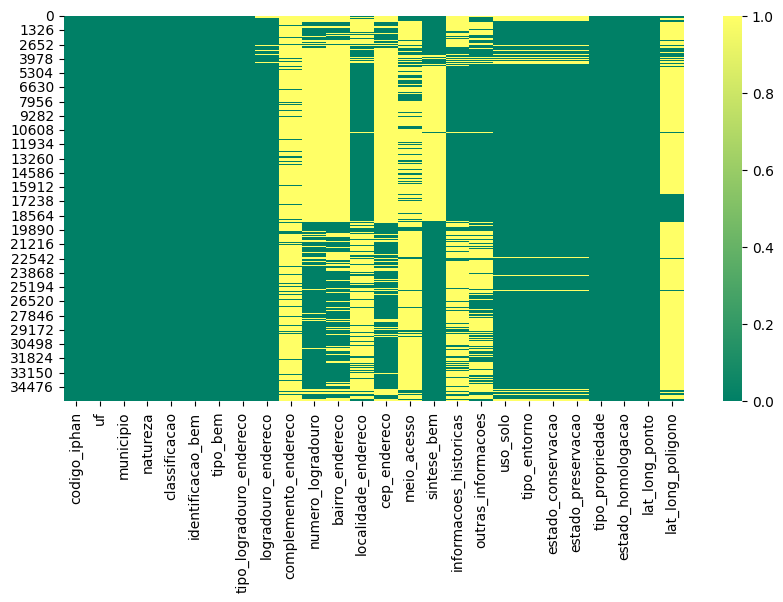

In [18]:
# Desenha um mapa de calor com base na seleção de dados nulos do dataset 
# setando o tamanho do gráfico
fig = plt.figure(figsize=(10,5)) 
sns.heatmap(df_bens.isnull(), cbar = True, cmap= "summer")
plt.show()

In [19]:
# Exclui as colunas (axis=1) especificadas e mostra o formato do dataset após exclusão
df_bens = df_bens.drop(['complemento_endereco','numero_logradouro','bairro_endereco',
                        'localidade_endereco', 'cep_endereco', 'meio_acesso','sintese_bem', 
                        'informacoes_historicas','outras_informacoes','lat_long_poligono'], 
                       axis=1)

df_bens.shape

(35786, 16)

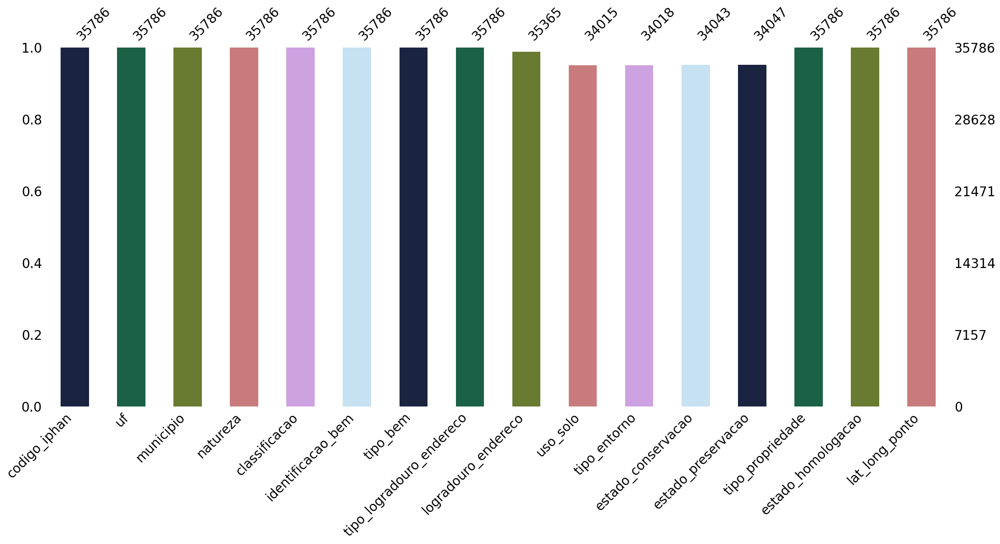

In [20]:
# Desenha gráfico de barras de dados nulos da base, após a exclusão das colunas do tipo MCAR 
fig = plt.figure(figsize=(10, 5)) 
msno.bar(df_bens, color = sns.color_palette('cubehelix'), fontsize=20);
plt.show()

<Figure size 1000x500 with 0 Axes>

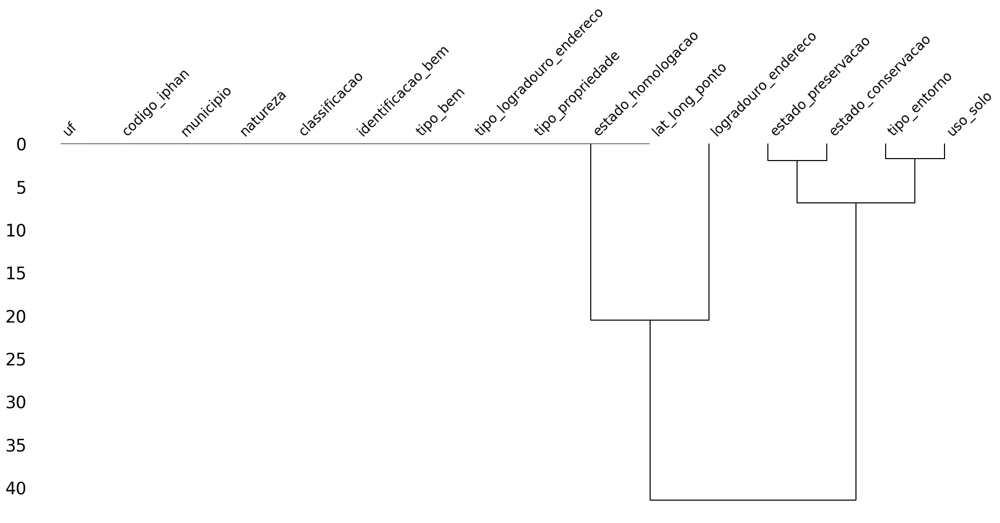

In [21]:
# Desenha dendrograma ilustrando a correlação entre nulidades das classes do dataset
fig = plt.figure(figsize=(10, 5))
msno.dendrogram(df_bens, fontsize=20)
plt.show()

In [22]:
# Seleciona as colunas específicadas no dendograma, para análise.
df_bens[['codigo_iphan', 'uf', 'municipio', 'identificacao_bem', 
         'tipo_bem','logradouro_endereco', 'uso_solo', 'tipo_entorno',
         'estado_homologacao','estado_conservacao', 'estado_preservacao']]

,codigo_iphan,uf,municipio,identificacao_bem,tipo_bem,logradouro_endereco,uso_solo,tipo_entorno,estado_homologacao,estado_conservacao,estado_preservacao
0,RJ3300233BAST00012,RJ,Armação dos Búzios,Sítio Aeroporto de Búzios,Sítio,None,None,None,Bem não homologado,None,None
1,RJ3304557BAST00012,RJ,Rio de Janeiro,Sambaqui do Galeão,Sítio,Ilha do Governador,Rural,Preservado,Bem parcialmente homologado,Ruim,Muito Alterado
2,PA1501402BAST00001,PA,Belém,Val de Cães,Sítio,None,None,None,Bem não homologado,Regular,Muito Alterado
3,AC1200013BIED00002,AC,Acrelândia,teste,Edificação,teste,Rural,Preservado,Bem parcialmente homologado,Bom,Íntegro
4,PA1504703BAAR00001,PA,Moju,TESTE,Bem ou conjunto de bens arqueológicos móveis,TESTE,Rural,Preservado,Bem não homologado,Bom,Íntegro
...,...,...,...,...,...,...,...,...,...,...,...
35781,MG3121605BIED00095,MG,Diamantina,"Imóvel no Beco da Paciência, sn - MG-3121605-B...",Edificação,"da Paciência, sn",Urbano,Preservado,Bem não homologado,Bom,Descaracterizado
35782,MG3121605BIED00102,MG,Diamantina,"Imóvel no Beco Lulu Quirino, 147 - MG-3121605-...",Edificação,"Lulu Quirino, 147",Urbano,Preservado,Bem não homologado,Bom,Pouco Alterado
35783,RS4314902BAST00019,RS,Porto Alegre,Lageado - Beco do Cerro,Sítio,"Beco Costa do Cerro,",Rural,Preservado,Bem totalmento homologado,Ruim,Muito Alterado
35784,MG3146107BIED01143,MG,Ouro Preto,"Imóvel situado ao Beco do Pilão, n°150 , Centr...",Edificação,do Pilão,Urbano,Preservado,Bem não homologado,Bom,Pouco Alterado


In [23]:
# Tabela do quantitativo de valores nulos presentes na classe estado_preservacao, separadas por tipo_bem
pd.crosstab([df_bens['tipo_bem']],  df_bens['estado_preservacao'].isna())

estado_preservacao,False,True
tipo_bem,,
Acervo,689,0
Artefato,353,0
Bem ou conjunto de bens arqueológicos móveis,3,0
Coleção,45,0
Conjunto Arquitetônico,613,0
Conjunto Urbano,234,58
Edificação,15633,0
Jardim Histórico,76,0
Obras de Engenharia,88,0


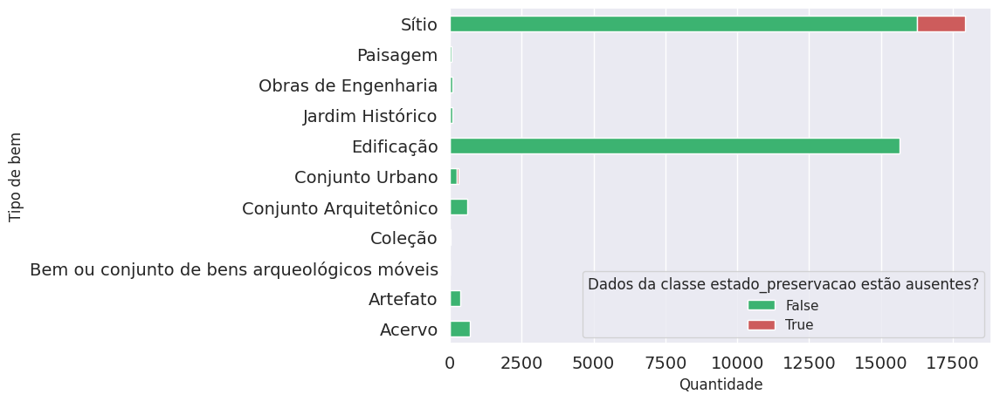

In [24]:
# Gráfico do quantitativo de valores nulos (isna) presentes na classe estado_preservacao, separadas por tipo_bem
sns.set() #corrigir erro gráfico colab
pd.crosstab([df_bens['tipo_bem']], df_bens['estado_preservacao'].isna()).plot.barh(stacked=True, color = ['mediumseagreen', 'indianred'],fontsize=14, figsize = (8,5)).grid(axis='y')
plt.legend(title = "Dados da classe estado_preservacao estão ausentes?", loc = 0)
plt.xlabel('Quantidade')
plt.ylabel('Tipo de bem', fontsize=12)
plt.show()

In [25]:
# Método .dropna remove valores ausentes das linhas (axis = 0) que possuem "NAN" nas colunas selecionadas
colunas_com_na = ['logradouro_endereco','uso_solo', 'tipo_entorno', 'estado_conservacao', 'estado_preservacao'] 
df_bens = df_bens.dropna(axis=0, subset = colunas_com_na)
df_bens.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33992 entries, 1 to 35785
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   codigo_iphan              33992 non-null  object
 1   uf                        33992 non-null  object
 2   municipio                 33992 non-null  object
 3   natureza                  33992 non-null  object
 4   classificacao             33992 non-null  object
 5   identificacao_bem         33992 non-null  object
 6   tipo_bem                  33992 non-null  object
 7   tipo_logradouro_endereco  33992 non-null  object
 8   logradouro_endereco       33992 non-null  object
 9   uso_solo                  33992 non-null  object
 10  tipo_entorno              33992 non-null  object
 11  estado_conservacao        33992 non-null  object
 12  estado_preservacao        33992 non-null  object
 13  tipo_propriedade          33992 non-null  object
 14  estado_homologacao    

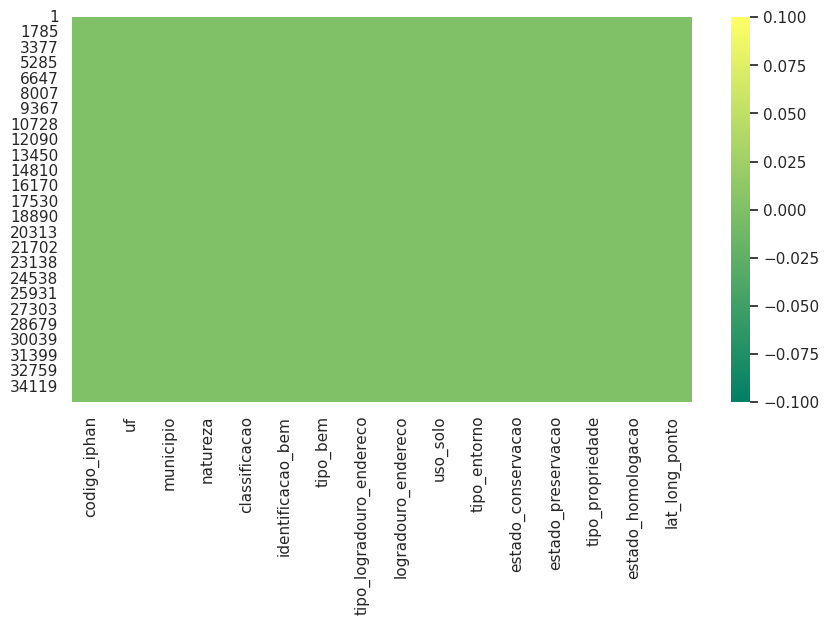

In [26]:
# Desenha um mapa de calor, após limpeza dos dados ausentes
fig = plt.figure(figsize=(10,5)) 
sns.heatmap(df_bens.isnull(), cbar = True, cmap= "summer")
plt.show()

### **4.1.2. Dados ruidosos**

Observa-se pela tabela abaixo que várias células do dataset apresentam dados ruidosos, ou seja, **dados sem sentido ou significado** que não podem ser interpretados por máquinas. Esses dados podem ter sido gerados devido a **coleta de dados defeituosa, erros de entrada de dados** etc. No dataset em análise percebemos que são o seguinte: **teste, sesc sp teste 2, TESTE, blabla teste, TESTE PERFIL EXTERNO**, dentre outros. 

Percebe-se que esses dados não possuem um padrão e estão espalhados por todas as classes do dataset.

In [27]:
# Seleciona apenas as colunas especificadas 
df_bens[['codigo_iphan', 'uf', 'municipio', 'natureza', 'classificacao', 
         'identificacao_bem', 'tipo_bem','logradouro_endereco', 'uso_solo', 'tipo_entorno',
         'estado_homologacao','estado_conservacao', 'estado_preservacao']].head(10)

,codigo_iphan,uf,municipio,natureza,classificacao,identificacao_bem,tipo_bem,logradouro_endereco,uso_solo,tipo_entorno,estado_homologacao,estado_conservacao,estado_preservacao
1,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sambaqui do Galeão,Sítio,Ilha do Governador,Rural,Preservado,Bem parcialmente homologado,Ruim,Muito Alterado
3,AC1200013BIED00002,AC,Acrelândia,Bem Imóvel,Arquitetura civil,teste,Edificação,teste,Rural,Preservado,Bem parcialmente homologado,Bom,Íntegro
4,PA1504703BAAR00001,PA,Moju,Bem Arqueológico,Sem classificação,TESTE,Bem ou conjunto de bens arqueológicos móveis,TESTE,Rural,Preservado,Bem não homologado,Bom,Íntegro
6,BA2921906BIED00006,BA,Mucugê,Bem Imóvel,Arquitetura civil,"Imóvel situado à Rua Dr. Rodrigues Lima, nº 15...",Edificação,Dr. Rodrigues Lima,Urbano,Alterado,Bem não homologado,Regular,Pouco Alterado
7,SP3550308BICA00010,SP,São Paulo,Bem Imóvel,Arquitetura civil,sesc sp teste 2,Conjunto Arquitetônico,teste sesc,Urbano,Alterado,Bem não homologado,Ruim,Íntegro
8,AC1200013BIOE00002,AC,Acrelândia,Bem Imóvel,Aqueduto,TESTE_EXCLUSAO,Obras de Engenharia,TESTE,Ambiental,Preservado,Bem não homologado,Bom,Íntegro
9,BA2921906BIED00098,BA,Mucugê,Bem Imóvel,Arquitetura civil,"Imóvel situado á Praça coronel douca medrado, ...",Edificação,Coronel Douca Medrado,Urbano,Alterado,Bem não homologado,Regular,Muito Alterado
10,AC1200013BIOE00001,AC,Acrelândia,Bem Imóvel,Aqueduto,TESTE,Obras de Engenharia,TESTE,Rural,Preservado,Bem não homologado,Bom,Íntegro
11,DF5300108BIOE00002,DF,Brasília,Bem Imóvel,Aqueduto,TESTE PERFIL EXTERNO,Obras de Engenharia,TESTE PERFIL EXTERNO,Urbano,Preservado,Bem não homologado,Bom,Íntegro
12,DF5300108BIOE00001,DF,Brasília,Bem Imóvel,Aqueduto,TESTETTTT,Obras de Engenharia,AS,Rural,Preservado,Bem não homologado,Bom,Íntegro


Uma análise mais apurada aponta que grande parte desses **dados estão correlacionados com a classe estado_homologacao do tipo Bem não homologado.**  

Em pesquisa realizada no Portal do IPHAN (SICG-Apresentacao-5_0.pdf), verificou-se que a **homologação quer dizer que os dados do bem em questão foram validados pelo Instituto**. Segundo IPHN (2012, pág. 87): 


>**Homologação Parcial** – Homologa os dados básicos do bem. É necessário que o bem tenha pelo menos uma proteção que não esteja cancelada e que os campos obrigatórios estejam preenchidos.

>**Homologação Total** – Homologa os dados complementares do bem, ou seja, cada (bem – natureza – tipo) são validados seus campos específicos. É necessário que o bem tenha pelo menos uma proteção que não esteja cancelada e que os campos obrigatórios de seus dados complementares estejam preenchidos


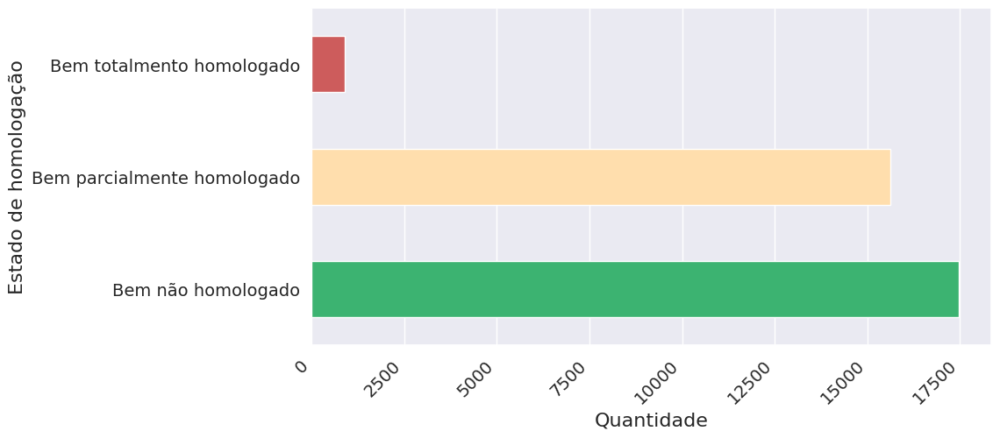

In [28]:
# Plota gráfico de barra com contagem de valores exclusivos da classe 'estado_homologacao'
sns.set() #corrigir erro gráfico colab
df_bens['estado_homologacao'].value_counts().plot.barh(color = ['mediumseagreen','navajowhite','indianred'], fontsize=14, figsize = (10,5)).grid(axis='y')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Quantidade', fontsize=16)
plt.ylabel('Estado de homologação', fontsize=16)
plt.show()

Considerando a definição do Iphan, acima exposta, conclui-se que por se tratarem de bens que **não tiveram seus dados básicos validados pelo órgão**, todos eles **serão excluídos** do dataset. Por oportuno, ressalta-se que esse subconjunto possui um percentual muito significativo de dados, **totalizando 51,4% do dataset (17471 registros)**, conforme demostra o gráfico de barras acima.

No entanto, entende-se que não é factível gerar resultados com base em dados não validados, uma vez que esses dados podem não representar a realidade e, consequentemente, gerar resultados não generalizáveis para o modelo.

In [29]:
# Exibe formato do dataset antes da exclusão dos registros com 'estado_homologacao' = "Bem não homologado"
df_bens.shape

(33992, 16)

In [30]:
# Exibe formato do dataset depois da exclusão dos registros com 'estado_homologacao' = "Bem não homologado"
# drop linhas (axis= 0) que atendem à condição. Foi necessário setar o índice para 'estado_homologacao' a fim de facilitar a exclusão
df_bens = df_bens.set_index('estado_homologacao').drop("Bem não homologado", axis = 0)
df_bens.shape

(16521, 15)

In [31]:
# Redefine o índice do dataset para padrão
df_bens = df_bens.reset_index(drop=False)

In [32]:
# Considerando a dificuldade de identificar dados ruidosos, optou-se por exportar a base de dados para csv e continuar a busca pelos dados ruidosos
# df_bens.to_csv('df_bens_ruidoso.xls') 

In [33]:
# Exclui registros que possuem "teste" (axis = 0 equivale a busca por linha)
df_bens = df_bens.set_index('identificacao_bem').drop("teste", axis = 0)
df_bens.shape

(16520, 15)

### **4.1.3. Dados duplicados**


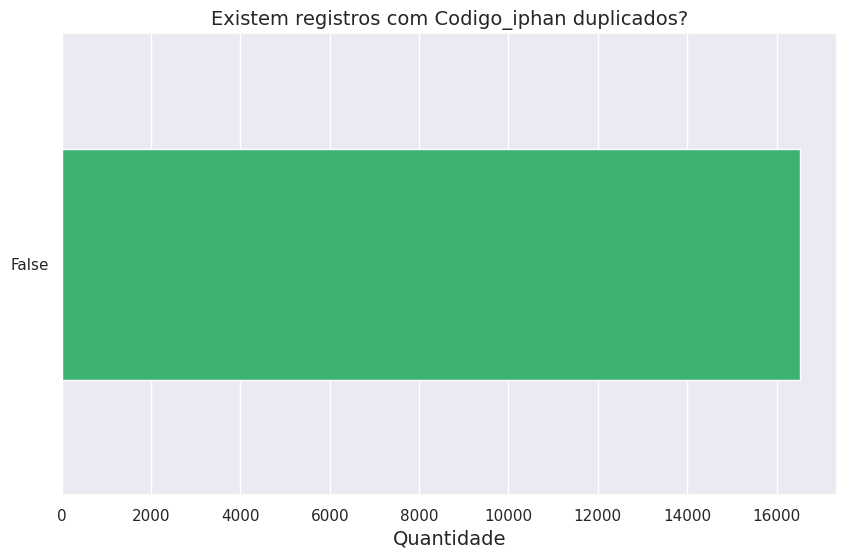

In [34]:
# Duplicated, com keep = False, retorna todos os registros duplicados como True. value_counts() retorna a quantidade de linhas duplicadas. 
sns.set() #corrigir erro gráfico colab
df_bens['codigo_iphan'].duplicated().value_counts().plot.barh(figsize = (10,6), color =['mediumseagreen']).grid(axis='y')
plt.xlabel('Quantidade',fontsize=14)
plt.title('Existem registros com Codigo_iphan duplicados?',fontsize=14)

plt.show()

In [35]:
# Redefine o índice do DataFrame e use o padrão
#df_bens = df_bens.set_index('codigo_iphan')
df_bens = df_bens.reset_index(drop=False)
df_bens

,identificacao_bem,estado_homologacao,codigo_iphan,uf,municipio,natureza,classificacao,tipo_bem,tipo_logradouro_endereco,logradouro_endereco,uso_solo,tipo_entorno,estado_conservacao,estado_preservacao,tipo_propriedade,lat_long_ponto
0,Sambaqui do Galeão,Bem parcialmente homologado,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sítio,Aeroporto,Ilha do Governador,Rural,Preservado,Ruim,Muito Alterado,Privada,MULTIPOINT(-43.242081 -22.819353)
1,TESTE,Bem parcialmente homologado,PA1502764BACL00001,PA,Cumaru do Norte,Bem Arqueológico,Amostras/fragmentos,Coleção,Aeroporto,a,Urbano,Alterado,Bom,Íntegro,Público,MULTIPOINT(-51.5163622753906 -8.78933557248401)
2,teste JJJ,Bem parcialmente homologado,DF5300108BAST00060,DF,Brasília,Bem Arqueológico,Histórico,Sítio,Alameda,rua,Rural,Alterado,Regular,Muito Alterado,Mista,MULTIPOINT(-47.8307595987 -15.6386513192)
3,Sambaqui do Vítor,Bem parcialmente homologado,PI2202083BAST00011,PI,Cajueiro da Praia,Bem Arqueológico,De contato,Sítio,Área,Barrinha,Rural,Preservado,Bom,Íntegro,Público,MULTIPOINT(-41.375278 -2.917222)
4,Sambaqui da Estrada,Bem parcialmente homologado,PI2202083BAST00001,PI,Cajueiro da Praia,Bem Arqueológico,De contato,Sítio,Área,Estrada do Cajueiro da Praia,Rural,Preservado,Ruim,Muito Alterado,Público,MULTIPOINT(-41.371443 -2.919279)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16515,Convento Carmelita: ruínas e Igreja de Nossa S...,Bem parcialmente homologado,PE2602902BICA00001,PE,Cabo de Santo Agostinho,Bem Imóvel,Arquitetura religiosa,Conjunto Arquitetônico,Vila,de Nazaré,Rural,Alterado,Regular,Pouco Alterado,Privada,MULTIPOINT(-34.95171367 -8.35360273899999)
16516,Fazenda São Sebastião,Bem totalmento homologado,RJ3304557BAST00120,RJ,Rio de Janeiro,Bem Arqueológico,Histórico,Sítio,Ilhas Atlânticas,Ilha do Governador,Ambiental,Alterado,Regular,Pouco Alterado,Outro,MULTIPOINT(-43.177802 -22.826966)
16517,Teste J3,Bem parcialmente homologado,DF5300108BAST00062,DF,Brasília,Bem Arqueológico,Histórico,Sítio,Beco,Rua,Urbano,Alterado,Regular,Muito Alterado,Público,MULTIPOINT(-47.8307595987 -15.6386513192)
16518,teste jjj22,Bem parcialmente homologado,DF5300108BAST00061,DF,Brasília,Bem Arqueológico,Histórico,Sítio,Beco,rua,Urbano,Alterado,Regular,Íntegro,Privada,MULTIPOINT(-47.8307595987 -15.6386513192)


### **4.1.4. Redução de dimensionalidade**

A redução da dimensionalidade (features) é o processo de **reduzir o número de variáveis** aleatórias pressentes no dataset. No presente estudo, optou-se por manter apenas as **variáveis consideradas como dados básicos** de preenchimento obrigatório no **SICG/IPHAN.** São elas: **'codigo_iphan', 'uf', 'municipio', 'natureza', 'classificacao', 'identificacao_bem', 'tipo_bem','uso_solo', 'tipo_entorno', 'estado_conservacao', 'estado_preservacao', 'tipo_propriedade'**.

In [36]:
# drop exclui as colunas (axis=1) selecionadas 
df_bens = df_bens.drop(['logradouro_endereco','tipo_logradouro_endereco',
                        'estado_homologacao', 'lat_long_ponto'], axis = 1)
df_bens.head()

,identificacao_bem,codigo_iphan,uf,municipio,natureza,classificacao,tipo_bem,uso_solo,tipo_entorno,estado_conservacao,estado_preservacao,tipo_propriedade
0,Sambaqui do Galeão,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sítio,Rural,Preservado,Ruim,Muito Alterado,Privada
1,TESTE,PA1502764BACL00001,PA,Cumaru do Norte,Bem Arqueológico,Amostras/fragmentos,Coleção,Urbano,Alterado,Bom,Íntegro,Público
2,teste JJJ,DF5300108BAST00060,DF,Brasília,Bem Arqueológico,Histórico,Sítio,Rural,Alterado,Regular,Muito Alterado,Mista
3,Sambaqui do Vítor,PI2202083BAST00011,PI,Cajueiro da Praia,Bem Arqueológico,De contato,Sítio,Rural,Preservado,Bom,Íntegro,Público
4,Sambaqui da Estrada,PI2202083BAST00001,PI,Cajueiro da Praia,Bem Arqueológico,De contato,Sítio,Rural,Preservado,Ruim,Muito Alterado,Público


In [37]:
# Exibe formato do dataset após alterações
df_bens.shape

(16520, 12)

In [38]:
df_bens.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16520 entries, 0 to 16519
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   identificacao_bem   16520 non-null  object
 1   codigo_iphan        16520 non-null  object
 2   uf                  16520 non-null  object
 3   municipio           16520 non-null  object
 4   natureza            16520 non-null  object
 5   classificacao       16520 non-null  object
 6   tipo_bem            16520 non-null  object
 7   uso_solo            16520 non-null  object
 8   tipo_entorno        16520 non-null  object
 9   estado_conservacao  16520 non-null  object
 10  estado_preservacao  16520 non-null  object
 11  tipo_propriedade    16520 non-null  object
dtypes: object(12)
memory usage: 1.5+ MB


## **4.2. Processamento e Tratamento da "Base Munic 2021/IBGE"**

### **4.2.1. Redução de dimensionalidade**

A segunda base a ser processada e tratada possui originalmente **5570 linhas × 239 classes.** Porém, nem todas as classes serão utilizadas no **escopo de estudo **desse trabalho que busca identificar a influência das políticas públicas existentes nos municípios na conservação de bens do Patrimônio Cultural. 

Dessa forma, **optou-se pela exclusão dos atributos que não serão utilizados** . Após a exclusão, a base passou a ter 93 colunas.

In [39]:
# Exibe o formato do dataset 
base_munic_cultura.shape

(5570, 239)

In [40]:
# Exclui todas as colunas (axis=1) que não serão utilizadas no escopo desse trabalho
base_munic_cultura = base_munic_cultura.drop(['CodMun','Cod UF','Pop', 'Faixa_pop','Regiao','Mcul04', 'Mcul05', 'Mcul051', 'Mcul101a','Mcul101b','Mcul102', 'Mcul1111',
 'Mcul1112', 'Mcul1113','Mcul1114','Mcul1115','Mcul1116','Mcul121','Mcul122','Mcul13','Mcul141', 'Mcul151a', 'Mcul151b', 'Mcul161', 'Mcul162', 'Mcul191a', 'Mcul191b', 'Mcul191c',
 'Mcul201','Mcul202','Mcul203','Mcul204','Mcul21','Mcul22','Mcul231','Mcul232','Mcul233','Mcul24','Mcul2411','Mcul2412','Mcul2413','Mcul2414','Mcul2415','Mcul2416','Mcul2417',
 'Mcul2418','Mcul2419','Mcul261a','Mcul261b', 'Mcul261c','Mcul271','Mcul272','Mcul273','Mcul274','Mcul28','Mcul29','Mcul301','Mcul302','Mcul303','Mcul31','Mcul3111','Mcul3112',
 'Mcul3113','Mcul3114','Mcul3115','Mcul3116','Mcul3117','Mcul3118','Mcul3119','Mcul331','Mcul39011','Mcul39021','Mcul39031', 'Mcul39041', 'Mcul39051','Mcul39061', 'Mcul39071', 
 'Mcul401', 'Mcul402', 'Mcul4211','Mcul4212','Mcul4213','Mcul4214','Mcul4215','Mcul4216','Mcul43','Mcul441','Mcul442','Mcul443','Mcul444','Mcul445','Mcul446','Mcul447',
 'Mcul448','Mcul449','Mcul4410','Mcul451','Mcul452','Mcul453','Mcul454','Mcul455','Mcul456','Mcul457','Mcul458','Mcul46','Mcul4611','Mcul4612','Mcul4613','Mcul4614', 'Mcul4615',
 'Mcul4616', 'Mcul4617', 'Mcul4618', 'Mcul4619', 'Mcul471', 'Mcul472', 'Mcul473', 'Mcul474', 'Mcul475', 'Mcul476', 'Mcul477', 'Mcul478', 'Mcul479', 'Mcul4710', 'Mcul4711', 
 'Mcul4712', 'Mcul4713', 'Mcul4714', 'Mcul4715', 'Mcul4716', 'Mcul4717', 'Mcul4718', 'Mcul4719', 'Mcul4720', 'Mcul4721', 'Mcul481', 'Mcul482', 'Mcul483', 'Mcul484', 'Mcul485', 
 'Mcul486', 'Mcul487',  'Mcul488', 'Mcul489', 'Mcul4810', 'Mcul4811'], axis = 1)

base_munic_cultura.shape

(5570, 93)

### **4.2.2. Dados ausentes**

Com a utilização do mapa de calor dos dados nulos foi possível verificar que a **base não apresenta dados ausentes.**

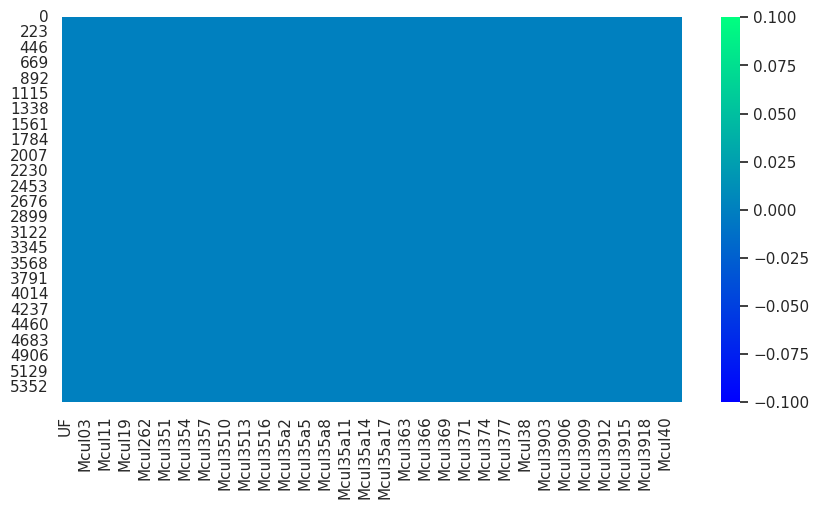

In [41]:
# Desenha um mapa de calor com base na seleção de dados nulos do dataset 
fig = plt.figure(figsize=(10,5)) # seta o tamanho do gráfico
sns.heatmap(base_munic_cultura.isnull(), cbar = True, cmap= 'winter')
plt.show()

### **4.2.3. Dados ruidosos**

Percebe-se a ocorrência de alguns **dados ruidodos, representados por hífen (-)**. Em análise mais apurada, foi possível **verificar um padrão** no qual toda vez que a classe **'Mcul35a17’** possui rótulo igual a **“Sim”,** as **demais classes** selecionadas são preenchidas com **hífen ou traço (-).**

In [42]:
# loc seleciona um grupo de linhas e colunas 
base_munic_cultura.loc[:10,'Mcul35a1':'Mcul35a17']

,Mcul35a1,Mcul35a2,Mcul35a3,Mcul35a4,Mcul35a5,Mcul35a6,Mcul35a7,Mcul35a8,Mcul35a9,Mcul35a10,Mcul35a11,Mcul35a12,Mcul35a13,Mcul35a14,Mcul35a15,Mcul35a16,Mcul35a17
0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
1,Sim,Sim,Sim,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim,Não,Sim,Não,-
2,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
3,Não,Sim,Sim,Sim,Não,Não,Não,Não,Não,Não,Não,Sim,Sim,Sim,Sim,Sim,-
4,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
5,Não,Não,Não,Sim,Não,Não,Não,Não,Não,Não,Sim,Não,Não,Não,Não,Não,-
6,Sim,Não,Sim,Não,Não,Não,Não,Não,Não,Sim,Não,Não,Não,Não,Não,Não,-
7,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim,-
8,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
9,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim


Conforme dicionário de dados, o atributo **'Mcul35a17’** representa como rótulo a opção **“Nenhuma das atividades”** anteriores, ou seja, **se a gestão municipal não apoiou nenhuma das atividades** disponíveis todas as **opções são preenchidas com um hífen (-)** que equivale a “não se aplica” ou simplesmente “não” apoiou nenhuma das anteriores. 

Nesse caso, há uma relação sistemática entre os dados ruidosos observados em 'Mcul35a17’ e as colunas compreendidas entre 'Mcul35a1' e 'Mcul35a16’, ou seja, são **dados do tipo Missing at random (MAR)** e n**ão podem ser simplesmente descartados**, devendo essa informação ser incorporada ao modelo.

Opetou-se pela **substituição do hífen (-)**presente nas colunas de 'Mcul35a1'até a 'Mcul35a16 **por “Não”** e, logo após,** exclusão do atributo ‘Mcul35a17**, uma vez que a informação presente nele já foi carregada para as anteriores. 

In [43]:
#  A função replace() é usada para substituir todos os valores de '-' por 'Não' nas colunas selecionadas. 
#  O resultado da substituição é atribuído novamente às mesmas colunas do DataFrame original.
base_munic_cultura.loc[:,'Mcul35a1':'Mcul35a16'] = base_munic_cultura.loc[:,'Mcul35a1':'Mcul35a16'].replace('-', 'Não')
base_munic_cultura.loc[:10,'Mcul35a1':'Mcul35a17']

,Mcul35a1,Mcul35a2,Mcul35a3,Mcul35a4,Mcul35a5,Mcul35a6,Mcul35a7,Mcul35a8,Mcul35a9,Mcul35a10,Mcul35a11,Mcul35a12,Mcul35a13,Mcul35a14,Mcul35a15,Mcul35a16,Mcul35a17
0,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim
1,Sim,Sim,Sim,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim,Não,Sim,Não,-
2,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim
3,Não,Sim,Sim,Sim,Não,Não,Não,Não,Não,Não,Não,Sim,Sim,Sim,Sim,Sim,-
4,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim
5,Não,Não,Não,Sim,Não,Não,Não,Não,Não,Não,Sim,Não,Não,Não,Não,Não,-
6,Sim,Não,Sim,Não,Não,Não,Não,Não,Não,Sim,Não,Não,Não,Não,Não,Não,-
7,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim,-
8,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim
9,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim


In [44]:
# Exclusão da coluna 'Mcul35a17'
base_munic_cultura = base_munic_cultura.drop('Mcul35a17', axis=1)

Esse **mesmo fenômeno se repete** para as colunas abaixo e, para todas elas foram adotados os mesmos procedimentos anteriores. 

1.	'Mcul3901'até a 'Mcul3920', onde 'Mcul3920' é “Nenhum dos itens relacionados”;
2.	'Mcul371'até a 'Mcul379', onde 'Mcul379' é “Nenhum dos itens”; 
3.	'Mcul361'até a 'Mcul3611', onde 'Mcul3611' é “Não desenvolve”; e
4.	'Mcul351'até a 'Mcul3517', onde 'Mcul3517' é “Nenhuma das atividades”.


In [45]:
# loc seleciona um grupo de linhas e colunas 
base_munic_cultura.loc[:,'Mcul3901':'Mcul3920'].query('Mcul3920 == "Sim"').head()

,Mcul3901,Mcul3902,Mcul3903,Mcul3904,Mcul3905,Mcul3906,Mcul3907,Mcul3908,Mcul3909,Mcul3910,Mcul3911,Mcul3912,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul3920
55,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
145,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
220,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
273,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
375,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim


In [46]:
# 'Mcul3901'até a 'Mcul3920', onde 'Mcul3920' é “Nenhum dos itens relacionados”
base_munic_cultura.loc[:,'Mcul3901':'Mcul3919'] = base_munic_cultura.loc[:,'Mcul3901':'Mcul3919'].replace('-', 'Não')

In [47]:
# Exclusão da coluna 'Mcul3920'
base_munic_cultura = base_munic_cultura.drop('Mcul3920', axis=1)
base_munic_cultura.shape

(5570, 91)

In [48]:
# 'Mcul371'até a 'Mcul379', onde 'Mcul379' é “Nenhum dos itens”
base_munic_cultura.loc[:,'Mcul371':'Mcul379'].query('Mcul379 == "Sim"').head()

,Mcul371,Mcul372,Mcul373,Mcul374,Mcul375,Mcul376,Mcul377,Mcul378,Mcul379
13,-,-,-,-,-,-,-,-,Sim
24,-,-,-,-,-,-,-,-,Sim
28,-,-,-,-,-,-,-,-,Sim
41,-,-,-,-,-,-,-,-,Sim
55,-,-,-,-,-,-,-,-,Sim


In [49]:
# 'Mcul371' até 'Mcul379', onde 'Mcul379' é “Nenhum dos itens relacionados”
base_munic_cultura.loc[:,'Mcul371':'Mcul379'] = base_munic_cultura.loc[:,'Mcul371':'Mcul379'].replace('-', 'Não')

In [50]:
# Exclusão da coluna 'Mcul379'
base_munic_cultura = base_munic_cultura.drop('Mcul379', axis=1)
base_munic_cultura.shape

(5570, 90)

In [51]:
# 'Mcul361'até a 'Mcul3611', onde 'Mcul3611' é “Não desenvolve”; 
base_munic_cultura.loc[:,'Mcul361':'Mcul3611'].query('Mcul3611 == "Sim"').head()

,Mcul361,Mcul362,Mcul363,Mcul364,Mcul365,Mcul366,Mcul367,Mcul368,Mcul369,Mcul3610,Mcul3611
2,-,-,-,-,-,-,-,-,-,-,Sim
3,-,-,-,-,-,-,-,-,-,-,Sim
10,-,-,-,-,-,-,-,-,-,-,Sim
12,-,-,-,-,-,-,-,-,-,-,Sim
14,-,-,-,-,-,-,-,-,-,-,Sim


In [52]:
# 'Mcul361'até a 'Mcul3611', onde 'Mcul3611' é “Não desenvolve”
base_munic_cultura.loc[:,'Mcul361':'Mcul3611'] = base_munic_cultura.loc[:,'Mcul361':'Mcul3611'].replace('-', 'Não')

In [53]:
# Exclusão da coluna 'Mcul2611'
base_munic_cultura = base_munic_cultura.drop('Mcul3611', axis=1)
base_munic_cultura.shape

(5570, 89)

In [54]:
# 'Mcul351'até a 'Mcul3517', onde 'Mcul3517' é “Nenhuma das atividades”
base_munic_cultura.loc[:,'Mcul351':'Mcul3517'].query('Mcul3517 == "Sim"').head() 

,Mcul351,Mcul352,Mcul353,Mcul354,Mcul355,Mcul356,Mcul357,Mcul358,Mcul359,Mcul3510,Mcul3511,Mcul3512,Mcul3513,Mcul3514,Mcul3515,Mcul3516,Mcul3517
0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
2,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
9,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
10,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim
12,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,Sim


In [55]:
# 'Mcul351'até a 'Mcul3517', onde 'Mcul3517' é “Nenhuma das atividades”
base_munic_cultura.loc[:,'Mcul351':'Mcul3517'] = base_munic_cultura.loc[:,'Mcul351':'Mcul3517'].replace('-', 'Não')

In [56]:
# Exclusão da coluna 'Mcul3517'
base_munic_cultura = base_munic_cultura.drop('Mcul3517', axis=1)
base_munic_cultura.shape

(5570, 88)

Outro tipo de **dado ruidoso **verificado é o **“Recusa”** que esse dado não se encontra “pul-verizado” por toda a base, mas sim que preenche todas as features de um registro, quando da sua ocorrência. Além disso, **somam apenas duas linhas **em todo o dataframe, não repre-sentando uma amostra significativa. Dessa forma, **optou-se pela exclusão desses dois regis-tros. **

In [57]:
# Selecionar todas as linhas que contêm o objeto "Recusa" em qualquer coluna
base_munic_cultura.loc[base_munic_cultura.isin(['Recusa']).any(axis=1)]

,UF,Mun,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
247,PA,Porto de Moz,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,...,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa
4559,SC,São José,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,...,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa,Recusa


In [58]:
# exclui as linhas do DataFrame pelo índice especificado
base_munic_cultura = base_munic_cultura.drop(index=[247, 4559])
base_munic_cultura.shape

(5568, 88)

Em continuidade ao processo de análise dos **dados ruidosos,** observou-se a ocorrência do valor** “Não informou”** de forma distribuída/pulverizada por várias colunas, em 49 amostras do datraframe. 

Considerou-se que esse **valor não carrega informação relevante** e equivale a um dado ausente, na medida em que **não foram identificadas relações** entre sua ocorrência e outros dados coletados.

Assim, pelo exposto e por se tratar de uma a**mostra relativamente pequena** da base de da-dos, **optou-se pela sua exclusão. **

In [59]:
# Selecionar todas as linhas que contêm o objeto "Não informou" em qualquer coluna
base_munic_cultura.loc[base_munic_cultura.isin(['Não informou']).any(axis=1)]

,UF,Mun,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
139,RR,Bonfim,Secretaria exclusiva,Masculino,Ensino superior incompleto,Não,-,Não,Não,Não,...,Não,Não,Sim,Não,Não,Não,Não,Não,Não informou,Não
150,RR,Uiramutã,Secretaria em conjunto com outras políticas se...,Feminino,Ensino superior completo,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,Não informou,Sim
156,PA,Alenquer,Secretaria exclusiva,Feminino,Ensino superior completo,Não,-,Não,Não,Não,...,Não,Não,Sim,Não,Sim,Não,Não,Não,Sem orçamento previsto,Não informou
245,PA,Ponta de Pedras,Secretaria exclusiva,Masculino,Ensino médio (2º Grau) completo,Não,-,Não,Não,Não informou,...,Não,Não,Não,Não,Não,Não,Não,Não,Não informou,Não informou
515,MA,Dom Pedro,Secretaria em conjunto com outras políticas se...,Masculino,Ensino superior completo,Não,-,Não,Sim,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,Não informou,Sim
526,MA,Governador Archer,Secretaria exclusiva,Masculino,Ensino médio (2º Grau) completo,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,Não informou,Não
543,MA,Jatobá,Secretaria exclusiva,Masculino,Ensino superior completo,"Sim, mas não é regulamentado por instrumento l...",Sim,Sim,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,Não informou,Não
560,MA,Marajá do Sena,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,...,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou,Não informou
585,MA,Paulino Neves,Secretaria exclusiva,Masculino,Ensino superior completo,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,Não informou,Sim
624,MA,São Domingos do Maranhão,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Em elaboração,-,Não,Não,Sim,...,Não,Não,Sim,Sim,Sim,Não,Não,Não,Não informou,Não


In [60]:
# Delete todas as linhas que contêm "Não informou"
base_munic_cultura = base_munic_cultura[~base_munic_cultura.isin(['Não informou']).any(axis=1)]
base_munic_cultura.shape

(5519, 88)

Verifica-se que algumas linhas ainda continham o hífen (-) em alguma das colunas. 

Há **indícios** importantes de que esse **ruído não ocorreu de forma aleatória,** por perda de dados ou falhas no sistema que pudesse caracterizá-los como Missing completely at random (MCAR). 

O **hífen (-)** que aparece **na coluna 'Mcul11**' sem-pre está **associado a “Não” ou “Em elaboração” na coluna 'Mcul10'**, enquanto que sua ocorrência nas colunas 'Mcul03' e 'Mcul06' está associada ao valor  “Não possui estrutura” na coluna 'Mcul03'. 

Ao recorrer ao dicionário dos dados, percebe-se que a reposta da coluna **'Mcul11' (Foi elaborado com a participação da sociedade civil) só faz sentido se a coluna 'Mcul10' (Plano Municipal de Cultura - existência) tiver sido preenchida com “Sim, por instrumento legal” ou  “Sim, mas não é regulamentado por instrumento legal”.** Do mesmo modo, se o município “Não possui estrutura” ('Mcul01'), entenda-se Órgão Gestor da Cultura, não é possível especificar o sexo ('Mcul03'), e escolaridade do Gestor ('Mcul06'). 

Assim, optou-se pela sua manutenção na base, porém **substituindo o hífen (-), valor com pouco significado, pelo termo “Não se aplica”**, que é mais intuitivo para fins de análises futuras. 


In [61]:
# Selecionar todas as linhas que contêm o objeto "-" em qualquer coluna
base_munic_cultura.loc[base_munic_cultura.isin(['-']).any(axis=1)]

,UF,Mun,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
0,RO,Alta Floresta DOeste,Secretaria em conjunto com outras políticas se...,Masculino,Ensino superior completo,Não,-,Não,Não,Não,...,Não,Não,Sim,Sim,Não,Não,Não,Não,até 10%,Não
1,RO,Ariquemes,Setor subordinado diretamente à chefia do Exe...,Feminino,Ensino superior completo,Não,-,Não,Sim,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Sim
2,RO,Cabixi,Secretaria em conjunto com outras políticas se...,Feminino,Ensino superior completo,Não,-,Não,Não,Não,...,Não,Não,Não,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Não
3,RO,Cacoal,Órgão da administração indireta,Masculino,Ensino superior completo,Em elaboração,-,Sim,Não,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Sim,Mais de 90%,Sim
4,RO,Cerejeiras,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Sim
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5564,GO,Varjão,Setor subordinado a outra secretaria,Feminino,Especialização,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,Sem orçamento previsto,Não
5565,GO,Vianópolis,Setor subordinado a outra secretaria,Masculino,Ensino superior completo,Não,-,Não,Sim,Sim,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Não
5566,GO,Vicentinópolis,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Sim,Não,Não,Não,até 10%,Não
5567,GO,Vila Boa,Não possui estrutura,-,-,Não,-,Não,Não,Não,...,Não,Não,Não,Não,Sim,Não,Não,Não,0,Não


In [62]:
# substitui todas as ocorrência de "-" por "Não se aplica"
base_munic_cultura = base_munic_cultura.replace('-', 'Não se aplica')

# Selecionar todas as linhas que contêm o objeto "-" em qualquer coluna
base_munic_cultura.loc[base_munic_cultura.isin(['Não se aplica']).any(axis=1)]

,UF,Mun,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
0,RO,Alta Floresta DOeste,Secretaria em conjunto com outras políticas se...,Masculino,Ensino superior completo,Não,Não se aplica,Não,Não,Não,...,Não,Não,Sim,Sim,Não,Não,Não,Não,até 10%,Não
1,RO,Ariquemes,Setor subordinado diretamente à chefia do Exe...,Feminino,Ensino superior completo,Não,Não se aplica,Não,Sim,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Sim
2,RO,Cabixi,Secretaria em conjunto com outras políticas se...,Feminino,Ensino superior completo,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Não
3,RO,Cacoal,Órgão da administração indireta,Masculino,Ensino superior completo,Em elaboração,Não se aplica,Sim,Não,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Sim,Mais de 90%,Sim
4,RO,Cerejeiras,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Sim
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5564,GO,Varjão,Setor subordinado a outra secretaria,Feminino,Especialização,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,Sem orçamento previsto,Não
5565,GO,Vianópolis,Setor subordinado a outra secretaria,Masculino,Ensino superior completo,Não,Não se aplica,Não,Sim,Sim,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Não
5566,GO,Vicentinópolis,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Sim,Não,Não,Não,até 10%,Não
5567,GO,Vila Boa,Não possui estrutura,Não se aplica,Não se aplica,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Sim,Não,Não,Não,0,Não


Por fim, ainda identificados o valor “(**)Sem gestor”**negrito** presente **em 2 colunas e 19 linhas do dataframe.** Observamos que em alguns municípios, embora haja estrutura/Órgão Gestor de Cultura, ocorre do órgão está sem Gestor no momento de realização da entrevista. 

Por se tratar de uma **amostra muito pequena**, acredita-se que ela não seja capaz de impactar nos testes que serão realizados a ponto de conseguir generalizar para outras bases. Assim, **optou-se pela sua exclusão.**

In [63]:
# Selecionar todas as linhas que contêm o objeto "(**)Sem gestor" em qualquer coluna
base_munic_cultura.loc[base_munic_cultura.isin(['(**)Sem gestor']).any(axis=1)]

,UF,Mun,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
647,MA,Serrano do Maranhão,Secretaria exclusiva,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Sim,Não,Não,Não,Sim,Sem orçamento previsto,Não
721,PI,Castelo do Piauí,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Não,...,Não,Não,Sim,Sim,Sim,Não,Não,Sim,de 11% a 20%,Sim
791,PI,Massapê do Piauí,Secretaria exclusiva,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Sim,...,Não,Não,Sim,Não,Não,Não,Não,Não,Sem orçamento previsto,Sim
1392,PB,Pombal,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Sim,Não,...,Sim,Não,Sim,Sim,Sim,Não,Não,Sim,de 41% a 50%,Sim
1968,BA,Guajeru,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Sim,...,Não,Não,Não,Sim,Sim,Não,Não,Sim,0,Não
2040,BA,Jeremoabo,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,de 61% a 70%,Sim
2068,BA,Maiquinique,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Sim
2489,MG,Divinolândia de Minas,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Em elaboração,Não se aplica,Não,Sim,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Não
2827,MG,Pescador,Secretaria em conjunto com outras políticas se...,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Sim,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Não
2972,MG,São João das Missões,Secretaria exclusiva,(**)Sem gestor,(**)Sem gestor,Não,Não se aplica,Não,Sim,Não,...,Não,Não,Não,Não,Não,Não,Não,Sim,de 21% a 30%,Não


In [64]:
# Delete todas as linhas que contêm "(**)Sem gestor"
base_munic_cultura = base_munic_cultura[~base_munic_cultura.isin(['(**)Sem gestor']).any(axis=1)]
base_munic_cultura.shape

(5500, 88)

### **4.2.4. Dados duplicados**

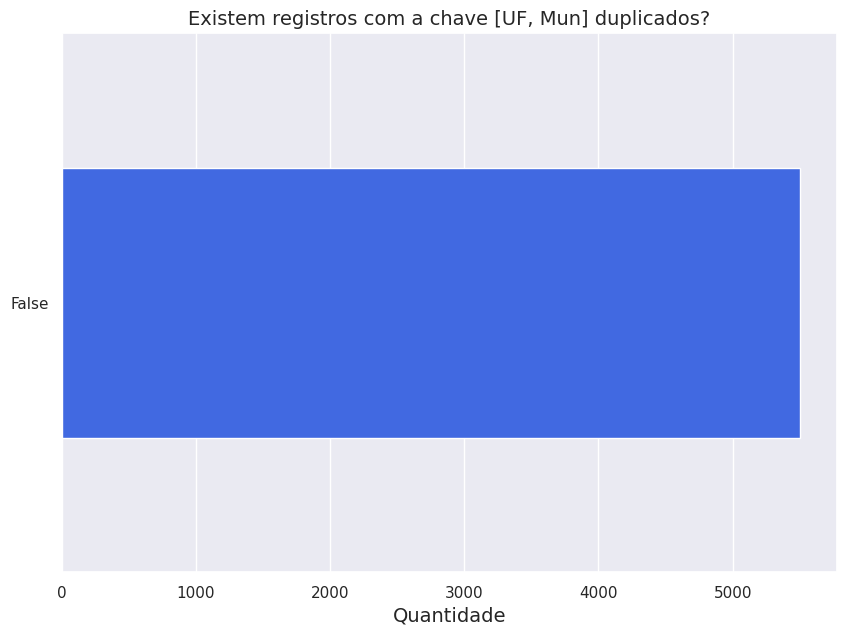

In [65]:
# Duplicated, com keep = False, retorna todos os registros duplicados como True. value_counts() retorna a quantidade de linhas duplicadas. 
sns.set() #corrigir erro gráfico colab
base_munic_cultura[['UF', 'Mun']].duplicated().value_counts().plot.barh(figsize = (10,7), color =['royalblue']).grid(axis='y')
plt.xlabel('Quantidade',fontsize=14)
plt.title('Existem registros com a chave [UF, Mun] duplicados?', fontsize=14)

# Show graph
plt.show()

## **4.3. Integração das bases e criação da “df_IPHAN_MUNIC_2021”**

In [66]:
# Renomeia a coluna 'Mun' da base_munic_cultura para permitir a comparação e integração dos dados a partir dessa coluna.
base_munic_cultura = base_munic_cultura.rename(columns = {'Mun': 'municipio', 'UF':'uf'})
base_munic_cultura.head()

,uf,municipio,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
0,RO,Alta Floresta DOeste,Secretaria em conjunto com outras políticas se...,Masculino,Ensino superior completo,Não,Não se aplica,Não,Não,Não,...,Não,Não,Sim,Sim,Não,Não,Não,Não,até 10%,Não
1,RO,Ariquemes,Setor subordinado diretamente à chefia do Exe...,Feminino,Ensino superior completo,Não,Não se aplica,Não,Sim,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Sim
2,RO,Cabixi,Secretaria em conjunto com outras políticas se...,Feminino,Ensino superior completo,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Sim,Sim,Não,Não,Não,Sem orçamento previsto,Não
3,RO,Cacoal,Órgão da administração indireta,Masculino,Ensino superior completo,Em elaboração,Não se aplica,Sim,Não,Sim,...,Sim,Não,Sim,Sim,Sim,Não,Não,Sim,Mais de 90%,Sim
4,RO,Cerejeiras,Secretaria em conjunto com outras políticas se...,Feminino,Especialização,Não,Não se aplica,Não,Não,Não,...,Não,Não,Não,Não,Não,Não,Não,Não,até 10%,Sim


In [67]:
# o método merge une as bases de dados pelas colunas 'uf' e 'municipio' (chave)
df_IPHAN_MUNIC_2021 = pd.merge(df_bens, base_munic_cultura, on=['uf', 'municipio'])
df_IPHAN_MUNIC_2021.head()

,identificacao_bem,codigo_iphan,uf,municipio,natureza,classificacao,tipo_bem,uso_solo,tipo_entorno,estado_conservacao,...,Mcul3913,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42
0,Sambaqui do Galeão,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sítio,Rural,Preservado,Ruim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim
1,Cais do Valongo /Cais da Imperatriz,RJ3304557BAST00011,RJ,Rio de Janeiro,Bem Arqueológico,Sem classificação,Sítio,Rural,Preservado,Bom,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim
2,Área do Parque do Flamengo tal como foi repres...,RJ3304557PSJD00004,RJ,Rio de Janeiro,Bem Paisagístico,Sem classificação,Jardim Histórico,Urbano,Alterado,Regular,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim
3,"Avenida Presidente Vargas 1122, Centro - Rio d...",RJ3304557BAST00123,RJ,Rio de Janeiro,Bem Arqueológico,Histórico,Sítio,Urbano,Alterado,Regular,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim
4,Casa Forte do Campinho,RJ3304557BAST00122,RJ,Rio de Janeiro,Bem Arqueológico,Histórico,Sítio,Urbano,Preservado,Regular,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim


In [68]:
df_IPHAN_MUNIC_2021.shape

(16140, 98)

In [69]:
# Exportação da base df_IPHAN_MUNIC_2021 em formato excel
# df_IPHAN_MUNIC_2021.to_excel('df_IPHAN_MUNIC_2021.xlsx')

### **4.3.1. Dados ausentes**

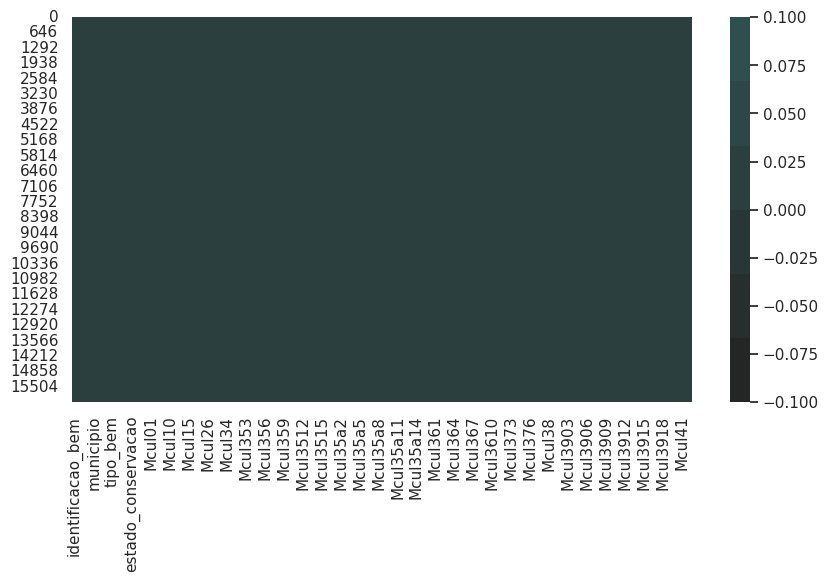

In [70]:
# Desenha um mapa de calor com base na seleção de dados nulos do dataset 
# setando o tamanho do gráfico
fig = plt.figure(figsize=(10,5)) 
sns.heatmap(df_IPHAN_MUNIC_2021.isnull(), cbar = True, cmap=sns.color_palette("dark:darkslategray"))
plt.show()

### **4.3.2. Dados duplicados**

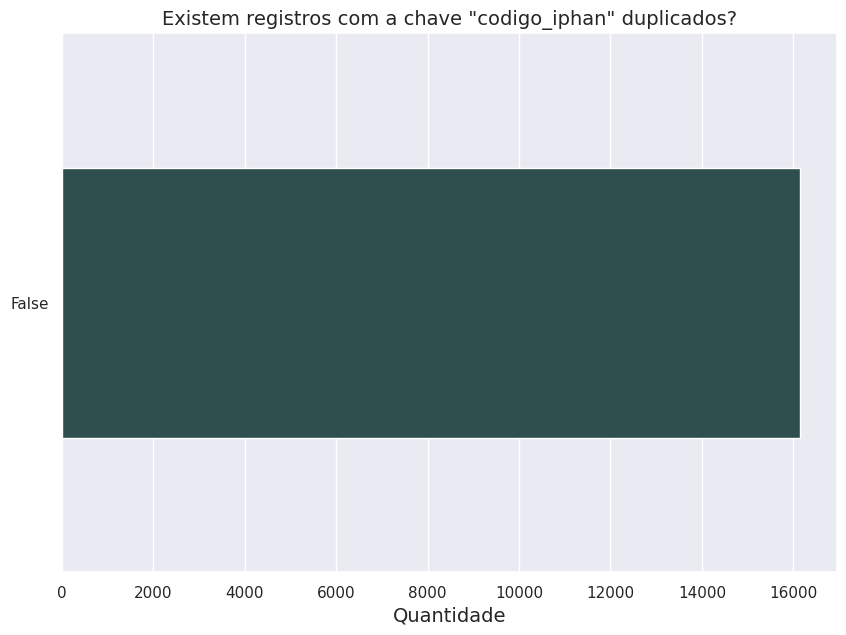

In [71]:
# Duplicated, com keep = False, retorna todos os registros duplicados como True. value_counts() retorna a quantidade de linhas duplicadas.
sns.set() #corrigir erro gráfico colab
df_IPHAN_MUNIC_2021[['codigo_iphan']].duplicated().value_counts().plot.barh(figsize = (10,7), color ='darkslategray').grid(axis='y')
plt.xlabel('Quantidade',fontsize=14)
plt.title('Existem registros com a chave "codigo_iphan" duplicados?', fontsize=14)

# Show graph
plt.show()

In [72]:
df_IPHAN_MUNIC_2021.shape

(16140, 98)

# **5. Análise e Exploração de Dados**

<ipython-input-73-098b3e24749c>:90: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=1)


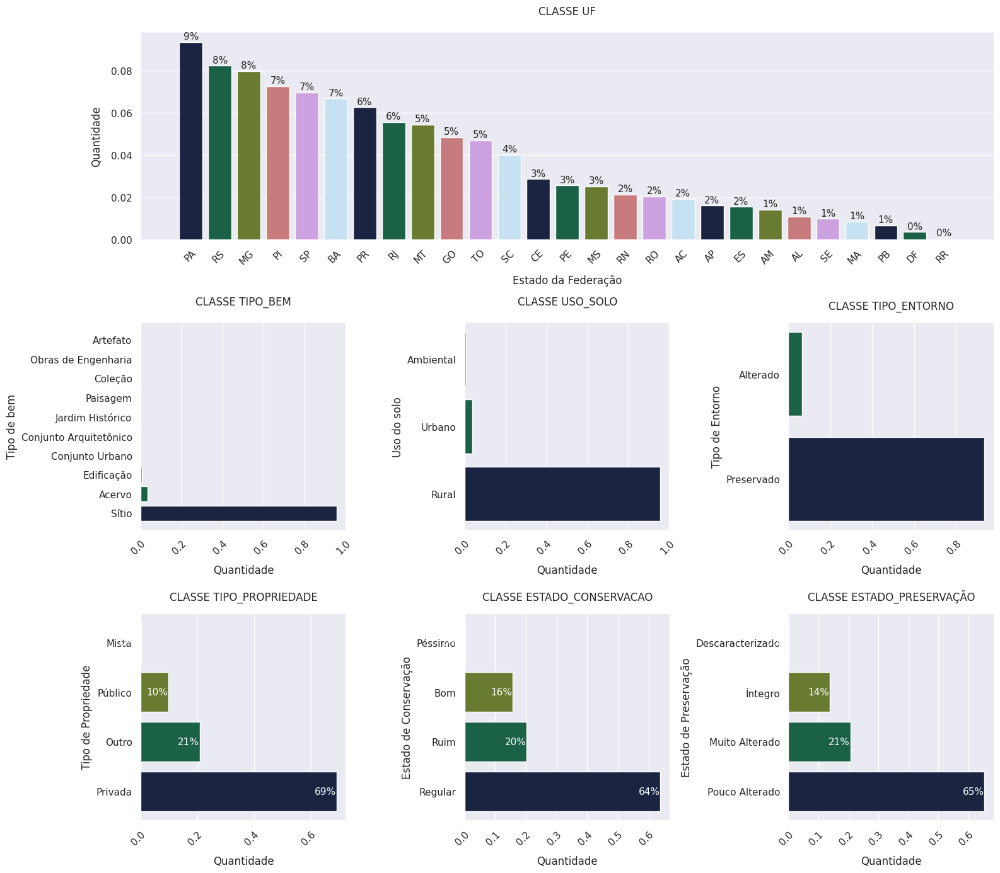

In [73]:
#@title Dashboard: **Perfil dos bens cadastrados no IPHAN**
sns.set() #corrigir erro gráfico colab

# Calcula a frequencia dos dados e reverte o index. 
frequenciaUF = df_IPHAN_MUNIC_2021['uf'].value_counts(normalize = True).reset_index()
frequenciaTipoBem = df_IPHAN_MUNIC_2021['tipo_bem'].value_counts(normalize = True).reset_index()
frequenciaUsoSolo = df_IPHAN_MUNIC_2021['uso_solo'].value_counts(normalize = True).reset_index()
frequenciaEntorno = df_IPHAN_MUNIC_2021['tipo_entorno'].value_counts(normalize = True).reset_index()
frequenciaPropriedade = df_IPHAN_MUNIC_2021['tipo_propriedade'].value_counts(normalize = True).reset_index()
frequenciaConservacao = df_IPHAN_MUNIC_2021['estado_conservacao'].value_counts(normalize = True).reset_index()
frequenciaPreservacao = df_IPHAN_MUNIC_2021['estado_preservacao'].value_counts(normalize = True).reset_index()

# Define o tamanho do gráfico
fig = plt.figure(figsize=(16,14), constrained_layout = True)

# Função para criar um dashboard
specs = gridspec.GridSpec(ncols = 3, nrows = 3, figure= fig)

ax1 = fig.add_subplot(specs[0, : ]) 
ax2 = fig.add_subplot(specs[1, 0 ]) 
ax3 = fig.add_subplot(specs[1, 1 ]) 
ax4 = fig.add_subplot(specs[1, 2 ])
ax5 = fig.add_subplot(specs[2, 0 ]) 
ax6 = fig.add_subplot(specs[2, 1 ]) 
ax7 = fig.add_subplot(specs[2, 2 ])

# GRÁFICO FREQUÊNCIA DA CLASSE TRATAMENTO
ax1.grid(axis = 'x')
ax1.bar(frequenciaUF['index'], frequenciaUF['uf'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax1.bar_label(ax1.containers[0], fmt="{:.0%}", size=11, padding=1, label_type="edge")
ax1.set_title('CLASSE UF', pad=20)
ax1.set_ylabel('Quantidade', labelpad = 10)
ax1.set_xlabel('Estado da Federação', labelpad = 10)

# GRÁFICO FREQUÊNCIA DA CLASSE Tipo
ax2.grid(axis = 'y')
ax2.barh(frequenciaTipoBem['index'], frequenciaTipoBem['tipo_bem'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
#ax2.bar_label(ax2.containers[0], fmt="%d", size=8, padding=1, label_type="edge")
ax2.set_title('CLASSE TIPO_BEM', pad=20)
ax2.set_ylabel('Tipo de bem')
ax2.set_xlabel('Quantidade', labelpad = 10, size=12)

# GRÁFICO FREQUÊNCIA DA CLASSE USO_SOLO
ax3.grid(axis = 'y')
ax3.barh(frequenciaUsoSolo['index'], frequenciaUsoSolo['uso_solo'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax3.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
#ax3.bar_label(ax3.containers[0], fmt="%d", size=8, padding=1, label_type="edge")
ax3.set_title('CLASSE USO_SOLO', pad=20)
ax3.set_ylabel('Uso do solo')
ax3.set_xlabel('Quantidade', labelpad = 10)

# GRÁFICO FREQUÊNCIA DA CLASSE TIPO_ENTORNO
ax4.grid(axis = 'y')
ax4.barh(frequenciaEntorno['index'], frequenciaEntorno['tipo_entorno'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax4.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
#ax4.bar_label(ax4.containers[0], fmt="%d", size=8, padding=1, label_type="edge")
ax4.set_title('CLASSE TIPO_ENTORNO', pad=15)
ax4.set_ylabel('Tipo de Entorno')
ax4.set_xlabel('Quantidade', labelpad = 10)

# GRÁFICO FREQUÊNCIA DA CLASSE TIPO_PROPRIEDADE
ax5.grid(axis = 'y')
ax5.barh(frequenciaPropriedade['index'], frequenciaPropriedade['tipo_propriedade'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax5.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax5.bar_label(ax5.containers[0], fmt="{:.0%}", size=11, color='white', padding=-25, label_type="edge")
ax5.set_title('CLASSE TIPO_PROPRIEDADE', pad=15)
ax5.set_ylabel('Tipo de Propriedade')
ax5.set_xlabel('Quantidade', labelpad = 10)

# GRÁFICO FREQUÊNCIA DA CLASSE ESTADO_CONSERVACAO
ax6.grid(axis = 'y')
ax6.barh(frequenciaConservacao['index'], frequenciaConservacao['estado_conservacao'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax6.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax6.bar_label(ax6.containers[0], fmt="{:.0%}", size=11, color='white', padding=-25, label_type="edge")
ax6.set_title('CLASSE ESTADO_CONSERVACAO', pad=15)
ax6.set_ylabel('Estado de Conservação')
ax6.set_xlabel('Quantidade', labelpad = 10)

# GRÁFICO FREQUÊNCIA DA CLASSE ESTADO DE PRESERVAÇÃO
ax7.grid(axis = 'y')
ax7.barh(frequenciaPreservacao['index'], frequenciaPreservacao['estado_preservacao'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax7.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax7.bar_label(ax7.containers[0], fmt="{:.0%}", size=11, color='white', padding=-25, label_type="edge")
ax7.set_title('CLASSE ESTADO_PRESERVAÇÃO',pad=15)
ax7.set_ylabel('Estado de Preservação')
ax7.set_xlabel('Quantidade', labelpad = 10)

fig.tight_layout(pad=1)
plt.show()
warnings.simplefilter(action='ignore', category=UserWarning)

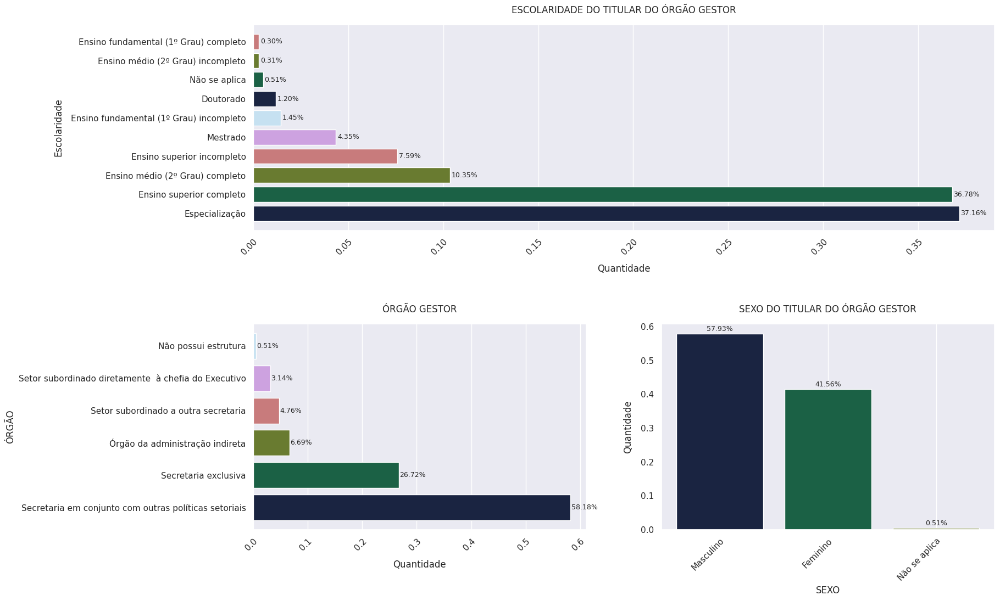

In [74]:
#@title Dashboard: **Perfil da Gestão Municipal de Cultura**

from matplotlib import ticker

sns.set() #corrigir erro gráfico colab

# Calcula a frequencia dos dados e reverte o index. 
EscolaridadeGestor = df_IPHAN_MUNIC_2021['Mcul06'].value_counts(normalize= True).reset_index()
SexoTitular = df_IPHAN_MUNIC_2021['Mcul03'].value_counts(normalize= True).reset_index()
OrgaoGestor = df_IPHAN_MUNIC_2021['Mcul01'].value_counts(normalize= True).reset_index()

# Define o tamanho do gráfico
fig = plt.figure(figsize=(19,16), constrained_layout = True)

# Função para criar um dashboard
specs = gridspec.GridSpec(ncols = 2, nrows = 3, figure= fig)

ax1 = fig.add_subplot(specs[0, : ]) 
ax2 = fig.add_subplot(specs[1, 0 ]) 
ax3 = fig.add_subplot(specs[1, 1 ]) 

# GRÁFICO ESCOLARIDADE DO TITULAR DO ÓRGÃO GESTOR
ax1.grid(axis = 'y')
ax1.barh(EscolaridadeGestor['index'], EscolaridadeGestor['Mcul06'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax1.bar_label(ax1.containers[0], fmt="{:.2%}", size=9, padding=2, label_type="edge")
ax1.set_title('ESCOLARIDADE DO TITULAR DO ÓRGÃO GESTOR', pad=15)
ax1.set_xlabel('Quantidade', labelpad = 10)
ax1.set_ylabel('Escolaridade', labelpad = 10)

# GRÁFICO ÓRGÃO GESTOR 
ax2.grid(axis = 'y')
ax2.barh(OrgaoGestor['index'], OrgaoGestor['Mcul01'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax2.bar_label(ax2.containers[0], fmt="{:.2%}", size=9, padding=1, label_type="edge")
ax2.set_title('ÓRGÃO GESTOR', pad=15)
ax2.set_ylabel('ÓRGÃO')
ax2.set_xlabel('Quantidade', labelpad = 10)

# GRÁFICO SEXO DO TITULAR DO ÓRGÃO GESTOR
ax3.grid(axis = 'y')
ax3.bar(SexoTitular['index'], SexoTitular['Mcul03'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax3.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax3.bar_label(ax3.containers[0], fmt="{:.2%}", size=9, padding=1, label_type="edge")
ax3.set_title('SEXO DO TITULAR DO ÓRGÃO GESTOR', pad=15)
ax3.set_xlabel('SEXO')
ax3.set_ylabel('Quantidade', labelpad = 10)

fig.tight_layout(pad=3)

plt.show()

warnings.simplefilter(action='ignore', category=UserWarning)

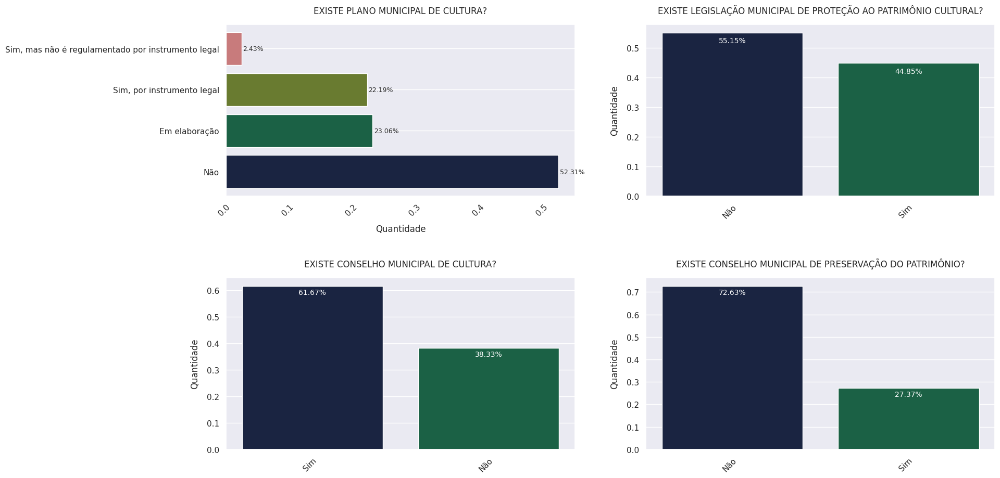

In [75]:
#@title Dashboard: **Políticas Públicas da Gestão Municipal de Cultura**
sns.set() #corrigir erro gráfico colab

# Calcula a frequencia dos dados e reverte o index. 
PlanoCultura = df_IPHAN_MUNIC_2021['Mcul10'].value_counts(normalize= True).reset_index()
LegPatrimonio = df_IPHAN_MUNIC_2021['Mcul15'].value_counts(normalize= True).reset_index()
ConselhoCultura = df_IPHAN_MUNIC_2021['Mcul19'].value_counts(normalize= True).reset_index()
ConselhoPatrimonio = df_IPHAN_MUNIC_2021['Mcul26'].value_counts(normalize= True).reset_index()

# Define o tamanho do gráfico
fig = plt.figure(figsize=(20,10), constrained_layout = True)

# Função para criar um dashboard
specs = gridspec.GridSpec(ncols = 2, nrows = 2, figure= fig)

ax1 = fig.add_subplot(specs[0, 0 ]) 
ax2 = fig.add_subplot(specs[0, 1 ]) 
ax3 = fig.add_subplot(specs[1, 0 ]) 
ax4 = fig.add_subplot(specs[1, 1 ]) 

# GRÁFICO EXISTE PLANO MUNICIPAL DE CULTURA?
ax1.grid(axis = 'x')
ax1.barh(PlanoCultura['index'], PlanoCultura['Mcul10'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax1.bar_label(ax1.containers[0], fmt="{:.2%}", size=9, padding=2, label_type="edge")
ax1.set_title('EXISTE PLANO MUNICIPAL DE CULTURA?', pad=15)
ax1.set_xlabel('Quantidade', labelpad = 10)
#ax1.set_ylabel()

# GRÁFICO EXISTE LEG. MUNIC. PROTEÇÃO AO PATRIMÔNIO?
ax2.grid(axis = 'x')
ax2.bar(LegPatrimonio['index'], LegPatrimonio['Mcul15'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax2.bar_label(ax2.containers[0], fmt="{:.2%}", size=10, color='white', padding=-16, label_type="edge")
ax2.set_title('EXISTE LEGISLAÇÃO MUNICIPAL DE PROTEÇÃO AO PATRIMÔNIO CULTURAL?', pad=15)
#ax5.set_xlabel('Tipo de Propriedade')
ax2.set_ylabel('Quantidade', labelpad = 10)

# GRÁFICO EXISTE CONSELHO MUNICIPAL DE CULTURA
ax3.grid(axis = 'x')
ax3.bar(ConselhoCultura['index'], ConselhoCultura['Mcul19'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax3.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax3.bar_label(ax3.containers[0], fmt="{:.2%}", size=10, color='white', padding=-14, label_type="edge")
ax3.set_title('EXISTE CONSELHO MUNICIPAL DE CULTURA?', pad=15)
#ax3.set_xlabel('Estado de Conservação')
ax3.set_ylabel('Quantidade',labelpad = 10)

# GRÁFICO EXISTE CONSELHO MUNICIPAL DE PRESERVAÇÃO DO PATRIMÔNIO
ax4.grid(axis = 'x')
ax4.bar(ConselhoPatrimonio['index'], ConselhoPatrimonio['Mcul26'], color = sns.color_palette('cubehelix'), zorder = 2)
plt.setp(ax4.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax4.bar_label(ax4.containers[0], fmt="{:.2%}", size=10, color='white', padding=-14, label_type="edge")
ax4.set_title('EXISTE CONSELHO MUNICIPAL DE PRESERVAÇÃO DO PATRIMÔNIO?', pad=15)
#ax4.set_xlabel('Estado de Preservação')
ax4.set_ylabel('Quantidade', labelpad = 10)

fig.tight_layout(pad=3)
plt.show()

warnings.simplefilter(action='ignore', category=UserWarning)

# **6. Criação de Modelo de Machine Learning**

### **6.1. Encoder**  

In [76]:
# Move a coluna 'estado_conservacao' para a última posição
df_IPHAN_MUNIC_2021 = df_IPHAN_MUNIC_2021[[col for col in df_IPHAN_MUNIC_2021.columns if col != 'estado_conservacao'] + ['estado_conservacao']]
df_IPHAN_MUNIC_2021.head()

,identificacao_bem,codigo_iphan,uf,municipio,natureza,classificacao,tipo_bem,uso_solo,tipo_entorno,estado_preservacao,...,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42,estado_conservacao
0,Sambaqui do Galeão,RJ3304557BAST00012,RJ,Rio de Janeiro,Bem Arqueológico,Pré-colonial,Sítio,Rural,Preservado,Muito Alterado,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim,Ruim
1,Cais do Valongo /Cais da Imperatriz,RJ3304557BAST00011,RJ,Rio de Janeiro,Bem Arqueológico,Sem classificação,Sítio,Rural,Preservado,Pouco Alterado,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim,Bom
2,Área do Parque do Flamengo tal como foi repres...,RJ3304557PSJD00004,RJ,Rio de Janeiro,Bem Paisagístico,Sem classificação,Jardim Histórico,Urbano,Alterado,Pouco Alterado,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim,Regular
3,"Avenida Presidente Vargas 1122, Centro - Rio d...",RJ3304557BAST00123,RJ,Rio de Janeiro,Bem Arqueológico,Histórico,Sítio,Urbano,Alterado,Pouco Alterado,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim,Regular
4,Casa Forte do Campinho,RJ3304557BAST00122,RJ,Rio de Janeiro,Bem Arqueológico,Histórico,Sítio,Urbano,Preservado,Pouco Alterado,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,Mais de 90%,Sim,Regular


In [77]:
# Redução de dimensionalidade 
df_IPHAN_MUNIC_2021 = df_IPHAN_MUNIC_2021.loc[:, 'Mcul01':'estado_conservacao']
df_IPHAN_MUNIC_2021.shape

(16140, 87)

In [78]:
df_IPHAN_MUNIC_2021.columns

Index(['Mcul01', 'Mcul03', 'Mcul06', 'Mcul10', 'Mcul11', 'Mcul14', 'Mcul15',
       'Mcul19', 'Mcul192', 'Mcul26', 'Mcul262', 'Mcul33', 'Mcul34', 'Mcul351',
       'Mcul352', 'Mcul353', 'Mcul354', 'Mcul355', 'Mcul356', 'Mcul357',
       'Mcul358', 'Mcul359', 'Mcul3510', 'Mcul3511', 'Mcul3512', 'Mcul3513',
       'Mcul3514', 'Mcul3515', 'Mcul3516', 'Mcul35a1', 'Mcul35a2', 'Mcul35a3',
       'Mcul35a4', 'Mcul35a5', 'Mcul35a6', 'Mcul35a7', 'Mcul35a8', 'Mcul35a9',
       'Mcul35a10', 'Mcul35a11', 'Mcul35a12', 'Mcul35a13', 'Mcul35a14',
       'Mcul35a15', 'Mcul35a16', 'Mcul361', 'Mcul362', 'Mcul363', 'Mcul364',
       'Mcul365', 'Mcul366', 'Mcul367', 'Mcul368', 'Mcul369', 'Mcul3610',
       'Mcul371', 'Mcul372', 'Mcul373', 'Mcul374', 'Mcul375', 'Mcul376',
       'Mcul377', 'Mcul378', 'Mcul38', 'Mcul3901', 'Mcul3902', 'Mcul3903',
       'Mcul3904', 'Mcul3905', 'Mcul3906', 'Mcul3907', 'Mcul3908', 'Mcul3909',
       'Mcul3910', 'Mcul3911', 'Mcul3912', 'Mcul3913', 'Mcul3914', 'Mcul3915',
      

In [192]:
# Ordinal Encoder das features X

mapa_colunas_ordinais = [
    {
        "col": "Mcul06",
        "mapping": {
            "Não se aplica": 0,
            "Ensino fundamental (1º Grau) incompleto": 1,
            "Ensino fundamental (1º Grau) completo": 2,
            "Ensino médio (2º Grau) incompleto": 3,
            "Ensino médio (2º Grau) completo": 4,
            "Ensino superior incompleto": 5,
            "Ensino superior completo": 6,
            "Especialização": 7,
            "Mestrado": 8,
            "Doutorado ": 9
        },
    },
    {
        "col": "Mcul10",
        "mapping": {
            "Não": 0,
            "Em elaboração": 1,
            "Sim, mas não é regulamentado por instrumento legal": 2,
            "Sim, por instrumento legal": 3
        },
    },
    {
        "col": "Mcul11",
        "mapping": {
            "Não se aplica": -1,
            "Não": 0,
            "Sim": 1
        },
    },
    {
        "col": "Mcul34",
        "mapping": {
            "Não se aplica": -1,
            "Não": 0,
            "Sim": 1
        },
    },
    {
        "col": "Mcul192",
        "mapping": {
            "Não se aplica": -1,
            "Tem maior representação governamental": 0,
            "Paritário": 1,
            "Tem maior representação da sociedade civil": 2

        },
    },
    {
        "col": "Mcul262",
        "mapping": {
            "Não se aplica": -1,
            "Tem maior representação governamental": 0,
            "Paritário": 1,
            "Tem maior representação da sociedade civil": 2

        },
    },
    {
        "col": "Mcul38",
        "mapping": {
            "Nenhum": 0,
            "Um": 1,
            "Dois": 2,
            "Três": 3,
            "Quatro": 4,
            "Cinco": 5,
            "Mais de 5": 6
        },
    },
    {
        "col": "Mcul41",
        "mapping": {
            "Sem orçamento previsto": -1,
            "0 ": 0,
            "até 10%": 1,
            "de 11% a 20%": 2,
            "de 21% a 30%": 3,
            "de 31% a 40%": 4,
            "de 41% a 50%": 5,
            "de 51% a 60%": 6,
            "de 61% a 70%": 7,
            "de 71% a 80%": 8,
            "de 81% a 90%": 9,
            "Mais de 90%": 10
        },
    },
]


In [193]:
# converte a list comprehension em um dataframe, apenas para melhor visualização 
df_mapa_colunas = pd.DataFrame(mapa_colunas_ordinais)
display(df_mapa_colunas)

,col,mapping
0,Mcul06,"{'Não se aplica': 0, 'Ensino fundamental (1º G..."
1,Mcul10,"{'Não': 0, 'Em elaboração': 1, 'Sim, mas não é..."
2,Mcul11,"{'Não se aplica': -1, 'Não': 0, 'Sim': 1}"
3,Mcul34,"{'Não se aplica': -1, 'Não': 0, 'Sim': 1}"
4,Mcul192,"{'Não se aplica': -1, 'Tem maior representação..."
5,Mcul262,"{'Não se aplica': -1, 'Tem maior representação..."
6,Mcul38,"{'Nenhum': 0, 'Um': 1, 'Dois': 2, 'Três': 3, '..."
7,Mcul41,"{'Sem orçamento previsto': -1, '0 ': 0, 'até 1..."


In [194]:
# Cria instância do codificador OrdinalEncoder
encoderOrder = ce.OrdinalEncoder(mapping = mapa_colunas_ordinais, return_df = True)

In [195]:
# Transformação do dataframe X_train com o OrdinalEncoder
df_IPHAN_MUNIC_2021 = encoderOrder.fit_transform(df_IPHAN_MUNIC_2021)
df_IPHAN_MUNIC_2021

,Mcul01,Mcul03,Mcul06,Mcul10,Mcul11,Mcul14,Mcul15,Mcul19,Mcul192,Mcul26,...,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42,estado_conservacao
0,Secretaria exclusiva,Masculino,6.0,1,-1,Sim,Sim,Sim,1,Sim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Ruim
1,Secretaria exclusiva,Masculino,6.0,1,-1,Sim,Sim,Sim,1,Sim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Bom
2,Secretaria exclusiva,Masculino,6.0,1,-1,Sim,Sim,Sim,1,Sim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular
3,Secretaria exclusiva,Masculino,6.0,1,-1,Sim,Sim,Sim,1,Sim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular
4,Secretaria exclusiva,Masculino,6.0,1,-1,Sim,Sim,Sim,1,Sim,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16135,Secretaria em conjunto com outras políticas se...,Feminino,7.0,0,-1,Não,Não,Não,-1,Não,...,Não,Não,Não,Sim,Não,Não,Não,-1.0,Não,Regular
16136,Secretaria em conjunto com outras políticas se...,Masculino,6.0,1,-1,Não,Não,Sim,1,Não,...,Não,Não,Não,Não,Não,Não,Sim,6.0,Sim,Regular
16137,Secretaria em conjunto com outras políticas se...,Feminino,6.0,0,-1,Não,Sim,Não,-1,Sim,...,Não,Não,Não,Não,Não,Não,Não,10.0,Sim,Regular
16138,Secretaria em conjunto com outras políticas se...,Masculino,6.0,1,-1,Não,Não,Não,-1,Não,...,Não,Não,Não,Não,Não,Não,Não,-1.0,Sim,Regular


In [196]:
# One-Hot Encoder: das colunas Mcul01	Mcul03

colunas_categoricas = ['Mcul01', 'Mcul03']

encoderOne = make_column_transformer(
    (OneHotEncoder(handle_unknown = 'ignore'),
    colunas_categoricas),
    remainder='passthrough', verbose_feature_names_out= False)

df_IPHAN_MUNIC_2021 = encoderOne.fit_transform(df_IPHAN_MUNIC_2021)
df_IPHAN_MUNIC_2021 = pd.DataFrame(df_IPHAN_MUNIC_2021, columns=encoderOne.get_feature_names_out())
df_IPHAN_MUNIC_2021.head()

,Mcul01_Não possui estrutura,Mcul01_Secretaria em conjunto com outras políticas setoriais,Mcul01_Secretaria exclusiva,Mcul01_Setor subordinado a outra secretaria,Mcul01_Setor subordinado diretamente à chefia do Executivo,Mcul01_Órgão da administração indireta,Mcul03_Feminino,Mcul03_Masculino,Mcul03_Não se aplica,Mcul06,...,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42,estado_conservacao
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Ruim
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Bom
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,Sim,Sim,Sim,Sim,Sim,Sim,Sim,10.0,Sim,Regular


In [197]:
print (df_IPHAN_MUNIC_2021.shape)

(16140, 94)


In [198]:
# Substitui todas as ocorrências do rótulo "Não" por 0 e "Sim" por 1
df_IPHAN_MUNIC_2021 = df_IPHAN_MUNIC_2021.replace({'Não': 0, 'Sim': 1})
df_IPHAN_MUNIC_2021.head()

,Mcul01_Não possui estrutura,Mcul01_Secretaria em conjunto com outras políticas setoriais,Mcul01_Secretaria exclusiva,Mcul01_Setor subordinado a outra secretaria,Mcul01_Setor subordinado diretamente à chefia do Executivo,Mcul01_Órgão da administração indireta,Mcul03_Feminino,Mcul03_Masculino,Mcul03_Não se aplica,Mcul06,...,Mcul3914,Mcul3915,Mcul3916,Mcul3917,Mcul3918,Mcul3919,Mcul40,Mcul41,Mcul42,estado_conservacao
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,1,1,1,1,1,1,1,10.0,1,Ruim
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,1,1,1,1,1,1,1,10.0,1,Bom
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,1,1,1,1,1,1,1,10.0,1,Regular
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,1,1,1,1,1,1,1,10.0,1,Regular
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,...,1,1,1,1,1,1,1,10.0,1,Regular


In [199]:
df_IPHAN_MUNIC_2021['estado_conservacao'].value_counts()

Regular    10307
Ruim        3277
Bom         2522
Péssimo       34
Name: estado_conservacao, dtype: int64

In [200]:
# excluir todas as linhas com o rótulo 'Péssimo' na coluna 'class'
# df_IPHAN_MUNIC_2021 = df_IPHAN_MUNIC_2021.drop(df_IPHAN_MUNIC_2021[df_IPHAN_MUNIC_2021['estado_conservacao'] == 'Péssimo'].index)
# df_IPHAN_MUNIC_2021.head()

In [201]:
# df_IPHAN_MUNIC_2021['estado_conservacao'].value_counts()

In [202]:
df_IPHAN_MUNIC_2021.shape

(16140, 94)

### 6.2. Análise de balanceamento dos dados em treino e teste

In [203]:
# atribui os valores das variáveis independentes a 'X'
X = df_IPHAN_MUNIC_2021.loc[:, 'Mcul01_Não possui estrutura':'Mcul42']

# atribui os valores da variável dependente a 'y'
y = df_IPHAN_MUNIC_2021['estado_conservacao']

# Partição treino/teste (80/20). Usa-se o parâmetro stratify para garantir a mesma proporção das classes no treino e teste.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify = y)

In [204]:
# Mostre as dimensões de treino e teste e confira o resultado.
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(12912, 93) (12912,)
(3228, 93) (3228,)


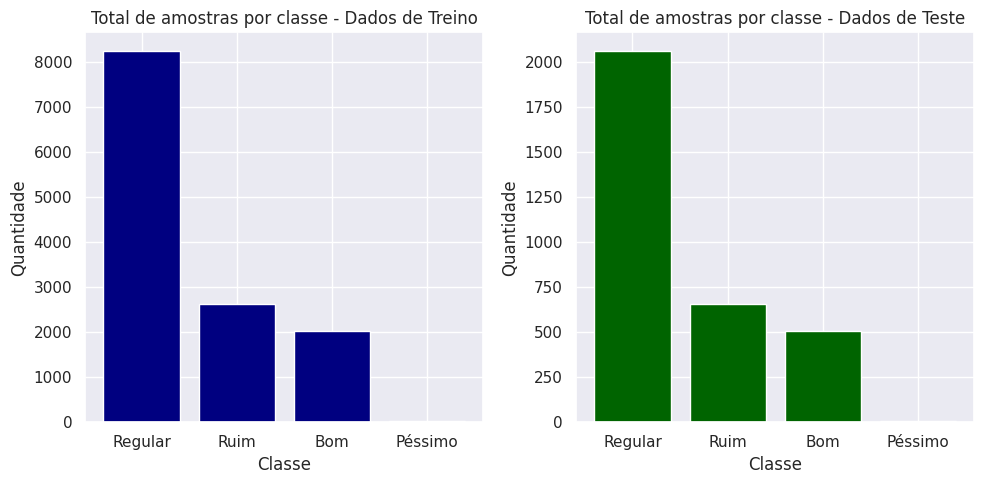

In [205]:
# Mostre o total de amostras por classe dos dados de treino e teste e confira se a proporção está semelhante.

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

x1 = y_train.value_counts().to_dict()
x2 = y_test.value_counts().to_dict()

axes[0].bar(x=list(x1.keys()), height=list(x1.values()), color = 'navy')
axes[0].set_xlabel('Classe')
axes[0].set_ylabel('Quantidade')
axes[0].set_title('Total de amostras por classe - Dados de Treino')

axes[1].bar(x=list(x2.keys()), height=list(x2.values()), color = 'darkgreen')
axes[1].set_xlabel('Classe')
axes[1].set_ylabel('Quantidade')
axes[1].set_title('Total de amostras por classe - Dados de Teste')

plt.tight_layout()
plt.show()

### 6.3. Particionamento, Resample e treinamento dos Modelos de Machine Learning

In [206]:
# IMPORTAÇÃO DOS MODELOS
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.dummy import DummyClassifier #Base comparativa 
from sklearn.svm import SVC

import warnings

# PARTICIONAMENTO DOS DADOS 
# atribui os valores das variáveis independentes a 'X'
X = df_IPHAN_MUNIC_2021.loc[:, 'Mcul01_Não possui estrutura':'Mcul42']

# atribui os valores da variável dependente a 'y'
y = df_IPHAN_MUNIC_2021['estado_conservacao']

# Partição treino/teste (80/20). Usa-se o parâmetro stratify para garantir a mesma proporção das classes no treino e teste.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify = y)

# RESAMPLE
# combinar as features e labels em um único conjunto de treinamento
train_data = pd.concat([X_train, y_train], axis=1)

# separa as classes minoritárias das majoritárias
class_majority = train_data[train_data['estado_conservacao']=='Regular']
class_minority1 = train_data[train_data['estado_conservacao']=='Ruim']
class_minority2 = train_data[train_data['estado_conservacao']=='Bom']
class_minority3 = train_data[train_data['estado_conservacao']=='Péssimo']


# Upsampling da classe minoritárias
class_minority1_resampled = resample(class_minority1,
                                 replace=True,    # amostragem com reposição
                                 n_samples=len(class_majority),    # número de amostras iguais à classe majoritária
                                 random_state=42) 

class_minority2_resampled = resample(class_minority2,
                                 replace=True,    # amostragem com reposição
                                 n_samples=len(class_majority),    # número de amostras iguais à classe majoritária
                                 random_state=42) 

class_minority3_resampled = resample(class_minority3,
                                 replace=True,    # amostragem com reposição
                                 n_samples=len(class_majority),    # número de amostras iguais à classe majoritária
                                 random_state=42) 

# combinar as classes resampled com a classe majoritária
train_data_resampled = pd.concat([class_majority, class_minority1_resampled, class_minority2_resampled, class_minority3_resampled])

# separar as features das labels no conjunto de treinamento downsampled
X_train_resampled = train_data_resampled.drop('estado_conservacao', axis=1)
y_train_resampled = train_data_resampled['estado_conservacao']

# TREINAMENTO DOS MODELOS DE MACHINE LEARNING - EXPERIMENTO 1
# conjunto de modelos a serem treinados 
models_resampled = [DummyClassifier(), SVC(), DecisionTreeClassifier(), RandomForestClassifier(), 
          SGDClassifier(), GaussianNB(), GradientBoostingClassifier()]

# cria lista de resiltados de cada modelo
#models_scores_resampled = []

COLUNAS1= ['Modelo', 'Media', 'Desvio']
df_scores_resampled = pd.DataFrame(columns=COLUNAS1)

for model in models_resampled:
    val_scores_resampled = cross_val_score(model, X_train_resampled, y_train_resampled, cv = 5)
    nome_modelo_resampled = type(model).__name__ # somente para exibição do nome do modelo no output
    print('Modelo: {} | Média: {:.2} | Desvio: {:.2} | Acurácia em cada cv: {}'.format(nome_modelo_resampled, np.mean(val_scores_resampled),
                                                                                       np.std(val_scores_resampled),val_scores_resampled))
    df_scores_resampled = df_scores_resampled.append({'Modelo': nome_modelo_resampled, 'Media': np.mean(val_scores_resampled), 'Desvio':np.std(val_scores_resampled)}, ignore_index=True)
    warnings.simplefilter(action='ignore', category=FutureWarning)

Modelo: DummyClassifier | Média: 0.25 | Desvio: 1.5e-05 | Acurácia em cada cv: [0.2499621 0.2499621 0.2499621 0.2499621 0.25     ]
Modelo: SVC | Média: 0.7 | Desvio: 0.0024 | Acurácia em cada cv: [0.69607397 0.69546764 0.69425496 0.70016674 0.69314736]
Modelo: DecisionTreeClassifier | Média: 0.77 | Desvio: 0.0014 | Acurácia em cada cv: [0.76944065 0.77019858 0.76944065 0.77307867 0.76925409]
Modelo: RandomForestClassifier | Média: 0.77 | Desvio: 0.0025 | Acurácia em cada cv: [0.771866   0.77656511 0.77429134 0.77808095 0.77198302]
Modelo: SGDClassifier | Média: 0.59 | Desvio: 0.011 | Acurácia em cada cv: [0.57465515 0.58390177 0.60178869 0.60118236 0.58474833]
Modelo: GaussianNB | Média: 0.32 | Desvio: 0.0027 | Acurácia em cada cv: [0.31377899 0.3165075  0.31514325 0.3165075  0.32186173]
Modelo: GradientBoostingClassifier | Média: 0.69 | Desvio: 0.0035 | Acurácia em cada cv: [0.68743368 0.69501288 0.68515992 0.68955586 0.68647665]


In [226]:
X.shape

(16140, 93)

### 6.4. Particionamento, SMOTE e treinamento dos Modelos de Machine Learning

In [207]:
# IMPORTAÇÃO DOS MODELOS
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.dummy import DummyClassifier #Base comparativa 
from sklearn.svm import SVC

import warnings

# PARTICIONAMENTO DOS DADOS DE TREINO
# atribui os valores das variáveis independentes a 'X'
X = df_IPHAN_MUNIC_2021.loc[:, 'Mcul01_Não possui estrutura':'Mcul42']

# atribui os valores da variável dependente a 'y'
y = df_IPHAN_MUNIC_2021['estado_conservacao']

# Partição treino/teste (80/20). Usa-se o parâmetro stratify para garantir a mesma proporção das classes no treino e teste.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify = y)

# SMOTE 
# Aplica o SMOTE para balancear as classes
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# TREINAMENTO DOS MODELOS DE MACHINE LEARNING - EXPERIMENTO 2 
models_smote = [DummyClassifier(), SVC(decision_function_shape ='ovo'), DecisionTreeClassifier(), RandomForestClassifier(), 
          SGDClassifier(), GaussianNB(), GradientBoostingClassifier()]

# cria lista de resultados de cada modelo
#models_scores_smote = []

COLUNAS = ['Modelo', 'Media', 'Desvio']
df_scores_smote = pd.DataFrame(columns=COLUNAS)

for model in models_smote:
    val_scores_smote = cross_val_score(model, X_train_smote, y_train_smote, cv = 5)
    nome_modelo_smote = type(model).__name__ # somente para exibição do nome do modelo no output
    print('Modelo: {} | Média: {:.2} | Desvio: {:.2} | Acurácia em cada cv: {}'.format(nome_modelo_smote, np.mean(val_scores_smote), 
                                                                                       np.std(val_scores_smote),val_scores_smote))    
    df_scores_smote = df_scores_smote.append({'Modelo': nome_modelo_smote, 'Media': np.mean(val_scores_smote), 'Desvio':np.std(val_scores_smote)}, ignore_index=True)
    warnings.simplefilter(action='ignore', category=FutureWarning)

Modelo: DummyClassifier | Média: 0.25 | Desvio: 1.5e-05 | Acurácia em cada cv: [0.2499621 0.2499621 0.2499621 0.2499621 0.25     ]
Modelo: SVC | Média: 0.72 | Desvio: 0.015 | Acurácia em cada cv: [0.69046536 0.71972109 0.73018039 0.73093831 0.72362038]
Modelo: DecisionTreeClassifier | Média: 0.79 | Desvio: 0.029 | Acurácia em cada cv: [0.73624375 0.79399727 0.81279369 0.81340003 0.80776228]
Modelo: RandomForestClassifier | Média: 0.81 | Desvio: 0.033 | Acurácia em cada cv: [0.74185236 0.80460816 0.83113536 0.82901319 0.82307459]
Modelo: SGDClassifier | Média: 0.59 | Desvio: 0.016 | Acurácia em cada cv: [0.6026982  0.57571623 0.61906927 0.59117781 0.57731959]
Modelo: GaussianNB | Média: 0.41 | Desvio: 0.0049 | Acurácia em cada cv: [0.40109141 0.40563893 0.40760952 0.41609823 0.40721649]
Modelo: GradientBoostingClassifier | Média: 0.72 | Desvio: 0.018 | Acurácia em cada cv: [0.6834925  0.71562832 0.73093831 0.72881613 0.72604609]


In [227]:
X_train_smote.shape

(32984, 93)

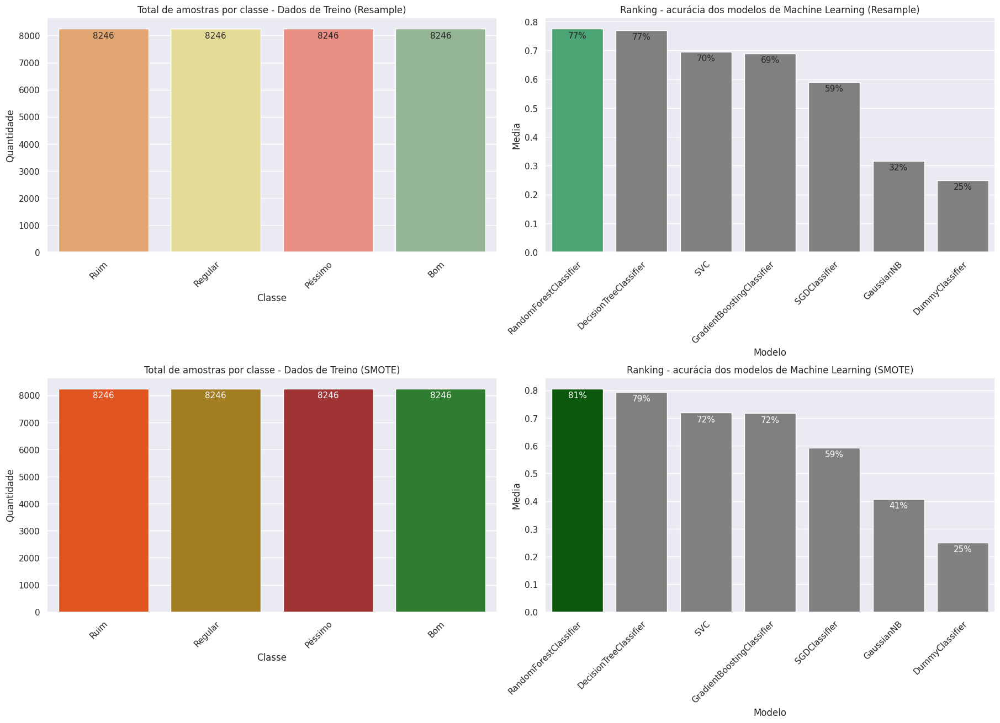

In [208]:
# @title 6.5. Comparação dos resultados dos modelos

sns.set() #corrigir erro gráfico colab

#Extraindo dados 
y1 = y_train_resampled.value_counts().reset_index().sort_values(by='index', ascending=False)
Ranking_resampled = df_scores_resampled.sort_values(by ='Media', ascending=False)
y2 = y_train_smote.value_counts().reset_index().sort_values(by='index', ascending=False)
Ranking_smote = df_scores_smote.sort_values(by ='Media', ascending=False)


# setando o tamanho do gráfico
fig = plt.figure(figsize=(18,13), constrained_layout = True) 

# Função para criar um dashboard
specs = gridspec.GridSpec(ncols = 2, nrows = 2, figure= fig)
ax1 = fig.add_subplot(specs[0, 0 ]) 
ax2 = fig.add_subplot(specs[0, 1 ]) 
ax3 = fig.add_subplot(specs[1, 0 ]) 
ax4 = fig.add_subplot(specs[1, 1 ])

#use orange for bar with max value and grey for all other bars
cols_smote = ['grey' if (x < max(Ranking_resampled.Media)) else 'darkgreen' for x in Ranking_resampled.Media]
cols_resampled = ['grey' if (x < max(Ranking_smote.Media)) else 'mediumseagreen' for x in Ranking_smote.Media]
cols_y = ['orangered','darkgoldenrod','firebrick','forestgreen']
cols_x = ['sandybrown','khaki','salmon','darkseagreen']


#Definindo os parametros do gráfico 1
#ax1 = fig.add_subplot(1, 2, 1)  # Adiciona a 1 linha, coluna 1
ax1.set_title("Total de amostras por classe - Dados de Treino (Resample)")
sns.barplot(x="index", y="estado_conservacao", ax=ax1, data=y1, palette = cols_x)
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax1.bar_label(ax1.containers[0], size=11, padding=-14, label_type="edge")
ax1.set_ylabel('Quantidade')
ax1.set_xlabel('Classe')

#Definindo os parametros do gráfico 2
#ax2 = fig.add_subplot(1, 2, 2)  # Adiciona a 1 linha, coluna 2
ax2.set_title("Ranking - acurácia dos modelos de Machine Learning (Resample)")
sns.barplot(x="Modelo", y="Media", ax=ax2, data=Ranking_resampled, palette = cols_resampled)
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax2.bar_label(ax2.containers[0], fmt="{:.0%}", size=11, padding=-14, label_type="edge")

#Definindo os parametros do gráfico 
#ax3 = fig.add_subplot(2, 2, 1)  # Adiciona a 2 linha, coluna 1
ax3.set_title("Total de amostras por classe - Dados de Treino (SMOTE)")
sns.barplot(x="index", y="estado_conservacao", ax=ax3, data=y2, palette = cols_y )
plt.setp(ax3.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax3.bar_label(ax3.containers[0], size=11,color='white', padding=-14, label_type="edge")
ax3.set_ylabel('Quantidade')
ax3.set_xlabel('Classe')

#Definindo os parametros do gráfico 
#ax4 = fig.add_subplot(2, 2, 2)  # Adiciona a 2 linha, coluna 2
ax4.set_title("Ranking - acurácia dos modelos de Machine Learning (SMOTE)")
sns.barplot(data=Ranking_smote, x="Modelo", y="Media", ax=ax4, palette = cols_smote)
plt.setp(ax4.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
ax4.bar_label(ax4.containers[0], fmt="{:.0%}", size=11, color='white', padding=-14, label_type="edge")

plt.show()

### **Fine tuning Random Forest Classifier (Melhor modelo)**

In [209]:
from sklearn.ensemble import RandomForestClassifier
from pprint import pprint

best_model = RandomForestClassifier()

# Look at parameters used by our current forest
print('Parametros usados atualmente no modelo Random Forest Classifier:\n')
pprint(best_model.get_params())

Parametros usados atualmente no modelo Random Forest Classifier:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [210]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
#from sklearn.pipeline import Pipeline,  make_pipeline # não aceita samplers no pipeline
from imblearn.pipeline import Pipeline, make_pipeline # aceita samplers no pipeline
import scipy.stats as stats


# Atribuição de valores às variáveis independentes 'X'
X = df_IPHAN_MUNIC_2021.loc[:, 'Mcul01_Não possui estrutura':'Mcul42']

# Atribuição de valores à variável dependente 'y'
y = df_IPHAN_MUNIC_2021['estado_conservacao']

# Partição treino/teste (80/20). Usa-se o parâmetro stratify para garantir a mesma proporção das classes no treino e teste.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify = y)

# Instancia o modelo Randon Forest Classifier
rfc = RandomForestClassifier()

# Definir pipeline com  SMOTE e RandomForestClassifier
pipeline1 = Pipeline([
    ('sampler', SMOTE()),
    ('classifier', rfc)
])

# Definindo os valores dos parâmetros para a busca randômica
param_distributions = {
    'classifier__n_estimators': stats.randint(50, 150),
    'classifier__max_depth': [None, 10, 20, 30, 40, 50],
    'classifier__min_samples_split': stats.randint(2, 6),
    'classifier__min_samples_leaf': stats.randint(1, 5),
}

# Definir RandomizedSearchCV com validação cruzada de 5 dobras
search = RandomizedSearchCV(pipeline1, param_distributions, refit = True, verbose=3, cv = 5)

# Ajustar o modelo usando o pipeline
search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END classifier__max_depth=40, classifier__min_samples_leaf=2, classifier__min_samples_split=3, classifier__n_estimators=75;, score=0.658 total time=   2.8s
[CV 2/5] END classifier__max_depth=40, classifier__min_samples_leaf=2, classifier__min_samples_split=3, classifier__n_estimators=75;, score=0.645 total time=   2.5s
[CV 3/5] END classifier__max_depth=40, classifier__min_samples_leaf=2, classifier__min_samples_split=3, classifier__n_estimators=75;, score=0.654 total time=   2.9s
[CV 4/5] END classifier__max_depth=40, classifier__min_samples_leaf=2, classifier__min_samples_split=3, classifier__n_estimators=75;, score=0.660 total time=   2.3s
[CV 5/5] END classifier__max_depth=40, classifier__min_samples_leaf=2, classifier__min_samples_split=3, classifier__n_estimators=75;, score=0.648 total time=   2.3s
[CV 1/5] END classifier__max_depth=None, classifier__min_samples_leaf=4, classifier__min_samples_split=5, classifi

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('sampler', SMOTE()),
                                             ('classifier',
                                              RandomForestClassifier())]),
                   param_distributions={'classifier__max_depth': [None, 10, 20,
                                                                  30, 40, 50],
                                        'classifier__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbc571cbb0>,
                                        'classifier__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbe26cb430>,
                                        'classifier__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbc4036070>},
                   verbose=3)

In [211]:
search.best_params_ 

{'classifier__max_depth': 40,
 'classifier__min_samples_leaf': 2,
 'classifier__min_samples_split': 3,
 'classifier__n_estimators': 75}

In [212]:
# Pontuação média de validação cruzada do modelo reajustado
search.best_score_

0.6528037849815258

In [213]:
from sklearn.metrics import accuracy_score

y_pred = search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"A acurácia do modelo é: {accuracy:.2f}")

A acurácia do modelo é: 0.65


In [214]:
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred)
print("Relatório de Classificação:")
print(report)

Relatório de Classificação:
              precision    recall  f1-score   support

         Bom       0.43      0.62      0.51       504
     Péssimo       0.07      0.14      0.09         7
     Regular       0.81      0.70      0.75      2061
        Ruim       0.50      0.53      0.52       656

    accuracy                           0.65      3228
   macro avg       0.45      0.50      0.47      3228
weighted avg       0.68      0.65      0.66      3228



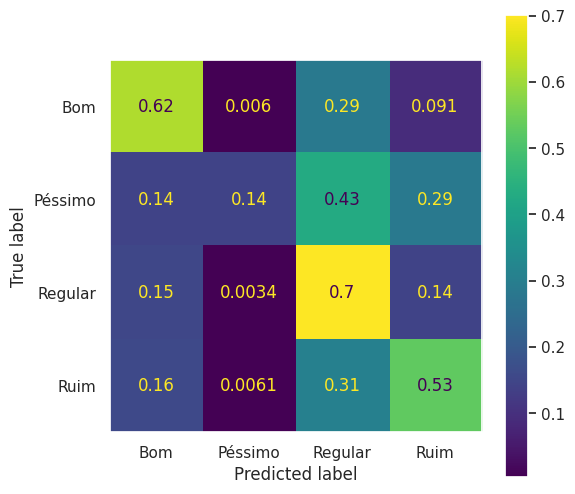

In [215]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

fig, _ = plt.subplots(nrows=1, figsize=(6,6))
ax = plt.subplot(1, 1, 1)
ax.grid(False)

classifier = search.best_estimator_
cm = confusion_matrix(y_test, y_pred, labels=classifier.classes_)
m_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # normaliza por linha

disp = ConfusionMatrixDisplay(confusion_matrix=m_percent, display_labels=classifier.classes_)
disp.plot(ax=ax)

plt.show()


In [216]:
# Acessar o modelo de classificação a partir do objeto RandomizedSearchCV
rf_model = search.best_estimator_.named_steps['classifier']

# Obter as importâncias das características
importances = rf_model.feature_importances_

In [217]:
# Obtendo as importâncias das features
importances = rf_model.feature_importances_

# Obtendo o nome das features
features = rf_model.feature_names_in_

# Obtendo os nomes das classes
class_names = rf_model.classes_

# Criando um dicionário para armazenar as features mais importantes para cada classe
top_features = {}

# Iterando sobre as classes
for i, class_name in enumerate(class_names):
    # Obtendo as importâncias das features para a classe i
    class_importances = importances[i]
    # Ordenando as importâncias em ordem decrescente
    sorted_indices = np.argsort(class_importances)[::-1]
    # Obtendo os nomes das features mais importantes
    top_features[class_name] = features[sorted_indices][:5]

# Imprimindo as features mais importantes para cada classe
for class_name, features in top_features.items():
    print(f'Recurso mais importante para a classe {class_name}:')
    for feature in features:
        print(f'\t{feature}')

Recurso mais importante para a classe Bom:
	Mcul01_Não possui estrutura
Recurso mais importante para a classe Péssimo:
	Mcul01_Não possui estrutura
Recurso mais importante para a classe Regular:
	Mcul01_Não possui estrutura
Recurso mais importante para a classe Ruim:
	Mcul01_Não possui estrutura


In [218]:
import pydotplus
from sklearn.tree import export_graphviz
from IPython.display import Image

# Exporte a árvore de decisão em um arquivo .dot
estimator = rf_model.estimators_[0]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = rf_model.feature_names_in_,
                class_names = rf_model.classes_,
                rounded = True, proportion = False, 
                precision = 1, filled = True)

# Converta o arquivo .dot em um arquivo .png
dot_data = export_graphviz(estimator, out_file=None, 
                feature_names = rf_model.feature_names_in_,
                class_names = rf_model.classes_,
                rounded = True, proportion = False, 
                precision = 1, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data)
graph.write_png('tree.png')

# Exiba a imagem da árvore de decisão
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.284532 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.284532 to fit



In [219]:
# Instancia o modelo Randon Forest Classifier
new_rfc = RandomForestClassifier()

rfecv = RFECV(estimator=DecisionTreeClassifier(random_state=42), step=1, cv=5, scoring='accuracy', )

# Definir pipeline com  SMOTE e RandomForestClassifier
rfecv_pipeline = Pipeline([
    ('seletor', rfecv),
    ('classifier', new_rfc)
])

# Definindo os valores dos parâmetros para a busca randômica
param_distributions = {
    'classifier__n_estimators': stats.randint(50, 150),
    'classifier__max_depth': [None, 10, 20, 30, 40, 50],
    'classifier__min_samples_split': stats.randint(2, 6),
    'classifier__min_samples_leaf': stats.randint(1, 5),
}

# Definir RandomizedSearchCV com validação cruzada de 5 dobras
search_rfecv = RandomizedSearchCV(rfecv_pipeline, param_distributions, refit = True, verbose=3, cv = 5)

# Ajustar o modelo usando o pipeline
search_rfecv.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END classifier__max_depth=50, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=82;, score=0.700 total time=  34.7s
[CV 2/5] END classifier__max_depth=50, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=82;, score=0.713 total time=  32.7s
[CV 3/5] END classifier__max_depth=50, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=82;, score=0.696 total time=  30.9s
[CV 4/5] END classifier__max_depth=50, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=82;, score=0.700 total time=  32.7s
[CV 5/5] END classifier__max_depth=50, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=82;, score=0.689 total time=  36.4s
[CV 1/5] END classifier__max_depth=10, classifier__min_samples_leaf=1, classifier__min_samples_split=4, classifier

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('seletor',
                                              RFECV(cv=5,
                                                    estimator=DecisionTreeClassifier(random_state=42),
                                                    scoring='accuracy')),
                                             ('classifier',
                                              RandomForestClassifier())]),
                   param_distributions={'classifier__max_depth': [None, 10, 20,
                                                                  30, 40, 50],
                                        'classifier__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbba437640>,
                                        'classifier__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbc66215e0>,
                                        'classifier__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fcbb8d37f40>},
                   verbose=3)

In [220]:
y_pred_best = search_rfecv.predict(X_test)
report = classification_report(y_test, y_pred_best)
print("Relatório de Classificação:")
print(report)

Relatório de Classificação:
              precision    recall  f1-score   support

         Bom       0.60      0.30      0.40       504
     Péssimo       0.50      0.14      0.22         7
     Regular       0.72      0.92      0.81      2061
        Ruim       0.69      0.36      0.47       656

    accuracy                           0.71      3228
   macro avg       0.63      0.43      0.47      3228
weighted avg       0.69      0.71      0.67      3228



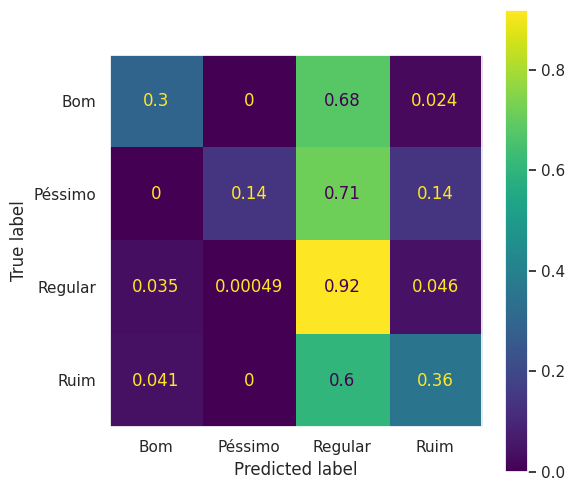

In [221]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

fig, _ = plt.subplots(nrows=1, figsize=(6,6))
ax = plt.subplot(1, 1, 1)
ax.grid(False)

classifier_rfecv = search_rfecv.best_estimator_
cm = confusion_matrix(y_test, y_pred_best, labels=classifier_rfecv.classes_)
m_percent_best = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # normaliza por linha
disp = ConfusionMatrixDisplay(confusion_matrix=m_percent_best, display_labels=classifier_rfecv.classes_)
disp.plot(ax=ax)

plt.show()


In [222]:
# Acessar o modelo de classificação a partir do objeto RandomizedSearchCV
rf_model_rfecv = search_rfecv.best_estimator_.named_steps['seletor']

# Obter as importâncias das características
rf_model_rfecv.n_features_ 

32

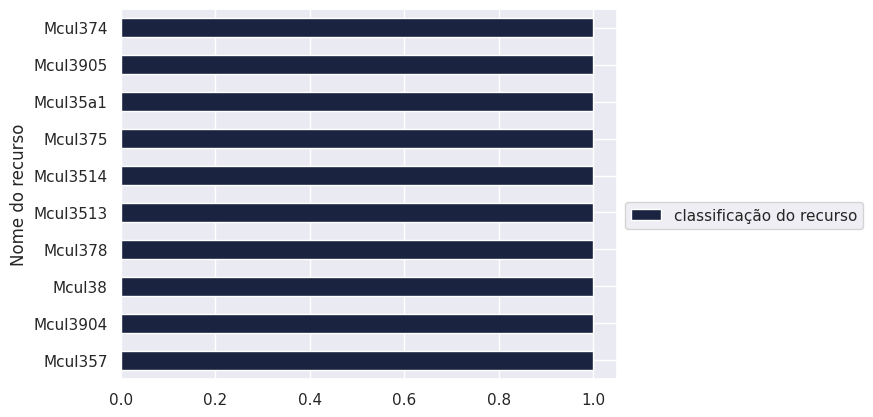

In [223]:
df_features_rfecv = pd.DataFrame(columns = ['Nome do recurso', 'classificação do recurso'])

for i in range(X.shape[1]):
    row = {'Nome do recurso':  rf_model_rfecv.feature_names_in_[i],'classificação do recurso': rf_model_rfecv.ranking_[i]}
    df_features_rfecv = df_features_rfecv.append(row, ignore_index=True)

df_features_rfecv.set_index('Nome do recurso', inplace=True)
df_features_rfecv.sort_values(by='classificação do recurso').head(10).plot(kind ="barh", color = sns.color_palette('cubehelix'))
plt.legend(loc = 0, bbox_to_anchor=(1, 0.5))


fig.tight_layout(pad=1)

plt.show()

warnings.simplefilter(action='ignore', category=UserWarning)

# **7. Interpretação dos Resultados**

Para o experimento com **SMOTE + RandonForestClassifier + RandonizedSearchCV,** recuperou-se os nomes dos recursos (feature_names_in_) vistos durante o ajuste e seus valores de importância baseados em impurezas **(feature_importances_), **também conhecido como importância de Gini.** Quanto mais alto esse valor, mais importante o recurso,** conforme documentação do algoritmo sklearn.ensemble.RandomForestClassifier. 

Dessa forma, com o auxílio da estrutura de repetição for, foi possível iterar sobre esses recursos, construir um DataFrame com esses valores e plotar o **ranking dos recursos mais importantes. **


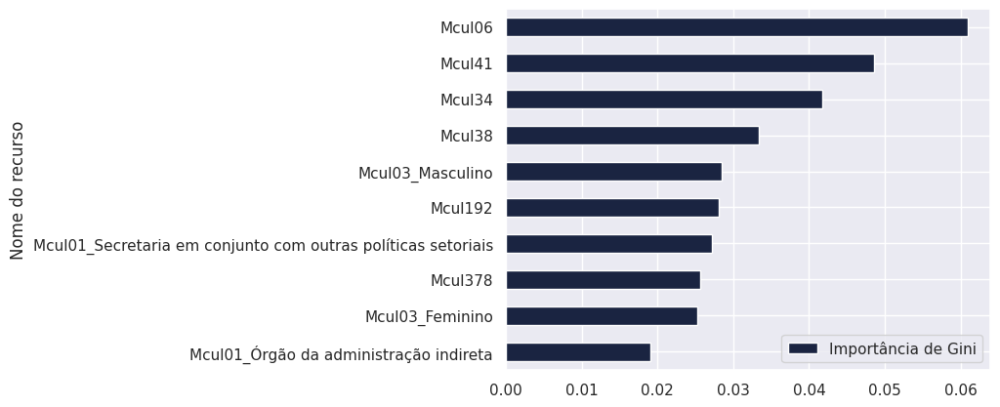

In [224]:
# Ranking das 10 features mais importantes, conforme experimento SMOTE + RandonForestClassifier + RandonizedSearchCV
df_features = pd.DataFrame(columns = ['Nome do recurso', 'Importância de Gini'])

for i in range(X.shape[1]):
    row = {'Nome do recurso':  rf_model.feature_names_in_[i],'Importância de Gini': rf_model.feature_importances_[i]}
    df_features = df_features.append(row, ignore_index=True)

df_features.set_index('Nome do recurso', inplace=True)
df_features.sort_values(by='Importância de Gini').tail(10).plot(kind ="barh", color = sns.color_palette('cubehelix'))


fig.tight_layout(pad=1)

plt.show()

warnings.simplefilter(action='ignore', category=UserWarning)


Com a utilização do atributo n_features_ verificou-se que** 32 classes foram selecionadas com validação cruzada** no experimento **RFECV + RandonForestClassifier + RandonizedSearchCV** e por meio dos atributos feature_names_in_ e ranking_ foi possível visualizar todas as classes melhores estimadas pelo RFECV. 

In [225]:
# Rankinga das 32 features mais importantes, conforme experimento RFECV + RandonForestClassifier + RandonizedSearchCV
df_features_rfecv = pd.DataFrame(columns = ['Nome do recurso', 'classificação do recurso'])

for i in range(X.shape[1]):
    row = {'Nome do recurso':  rf_model_rfecv.feature_names_in_[i],'classificação do recurso': rf_model_rfecv.ranking_[i], 'Foi ativada?': rf_model_rfecv.support_[i]}
    df_features_rfecv = df_features_rfecv.append(row, ignore_index=True)

df_features_rfecv.set_index('Nome do recurso', inplace=True)
df_features_rfecv.sort_values(by='classificação do recurso').head(33)

,classificação do recurso,Foi ativada?
Nome do recurso,,
Mcul357,1,True
Mcul3904,1,True
Mcul38,1,True
Mcul378,1,True
Mcul3513,1,True
Mcul3514,1,True
Mcul375,1,True
Mcul35a1,1,True
Mcul3905,1,True


Retomando o **problema desse trabalho**, constatou-se que as** dez características do perfil de gestão municipal da cultura do ano de 2021 que mais contribuem para a caracteri-zação do estado de conservação dos bens culturais**, registrado no Sistema Integrado de Co-nhecimento e Gestão – SICG/IPHAN são: 

1.	Mcul06 - Escolaridade do(a) titular do órgão gestor;
2.	Mcul41 - Quanto do orçamento previsto para a cultura foi executado em 2020; 
3.	Mcul34 - O fundo municipal de cultura reúne todos os recursos orçamentários e de outras fontes destinados aos programas culturais; 
4.	Mcul38 – Quantidade de canais de TV aberta captados no município; 
5.	Mcul01 – Órgão Gestor: Secretaria em conjunto com outras políticas setoriais;
6.		Mcul192 – Formação do Conselho Municipal de Cultura;
7.	Mcul03 – Sexo do(a) titular do órgão gestor: feminino;
8.	Mcul03 – Sexo do(a) titular do órgão gestor: marculino;
9.	Mcul378 - Provedor de internet (existência no município); e
10.	Mcul362: A gestão municipal desenvolveu, nos últimos 12 meses, programa ou ação para a implantação, reforma ou modernização de: Biblioteca pública.

Todas as características acima, **com exceção da Mcul03 – Sexo do(a) titular do órgão gestor: feminino,** figuraram entre as melhores estimadas nos experimentos com: 

1.	SMOTE, RandomForestClassifier e RandomizedSearchCV; e
2.	RFECV (estimador DecisonTreeClassifier), RandomForestClassifier e Randomi-zedSearchCV. 

Embora, nesse último, o RFECV tenha selecionado 32 classes como as melhores estimadas elas não foram consideradas pois, observou-se que **sem o SMOTE a acurácia melho-rou devido ao aumento do número de acertos na classe majoritária e não a uma melhoria global** no desempenho do modelo, o que reforça que essa métrica não é a melhor para ava-liação de modelos cujas classes encontram-se desbalanceadas. 

Portanto, conclui-se que, embora a técnica de balanceamento **SMOTE não** tenha sido capaz de **impedir que a classe majoritária fosse beneficiada**, ele proporcionou uma melhoria no sentido de **equilibrar os resultados**, de modo geral, em todas as classes do estado de conservação. 


# **8. Comunicação dos Resultados**

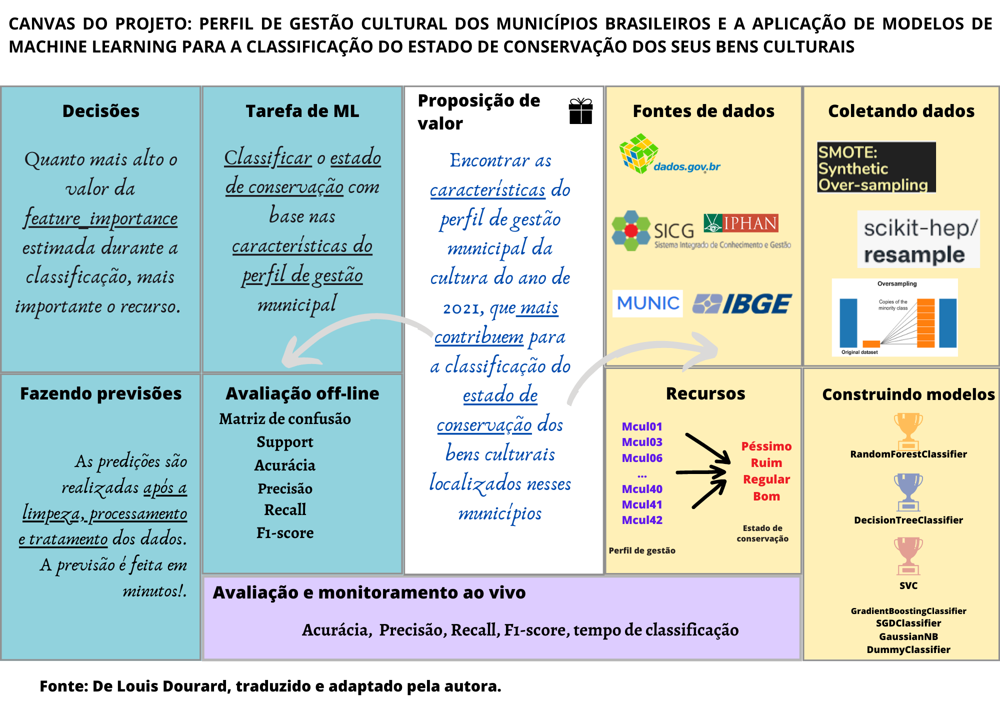